Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

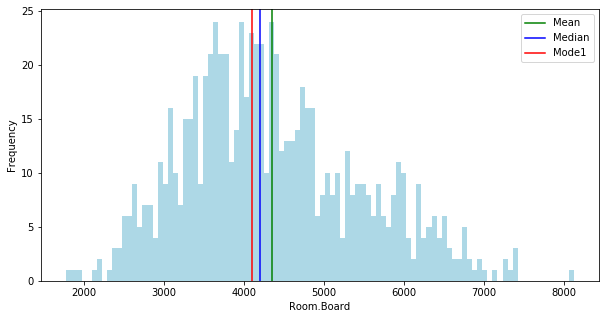

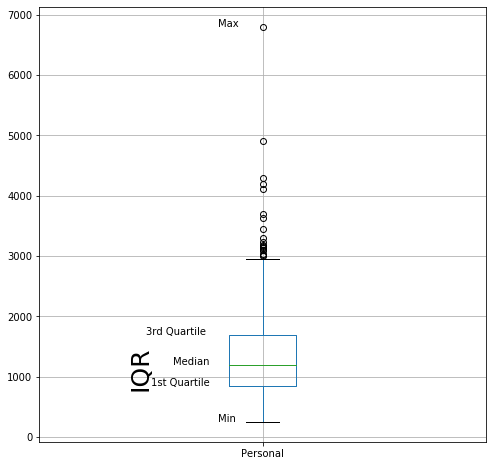

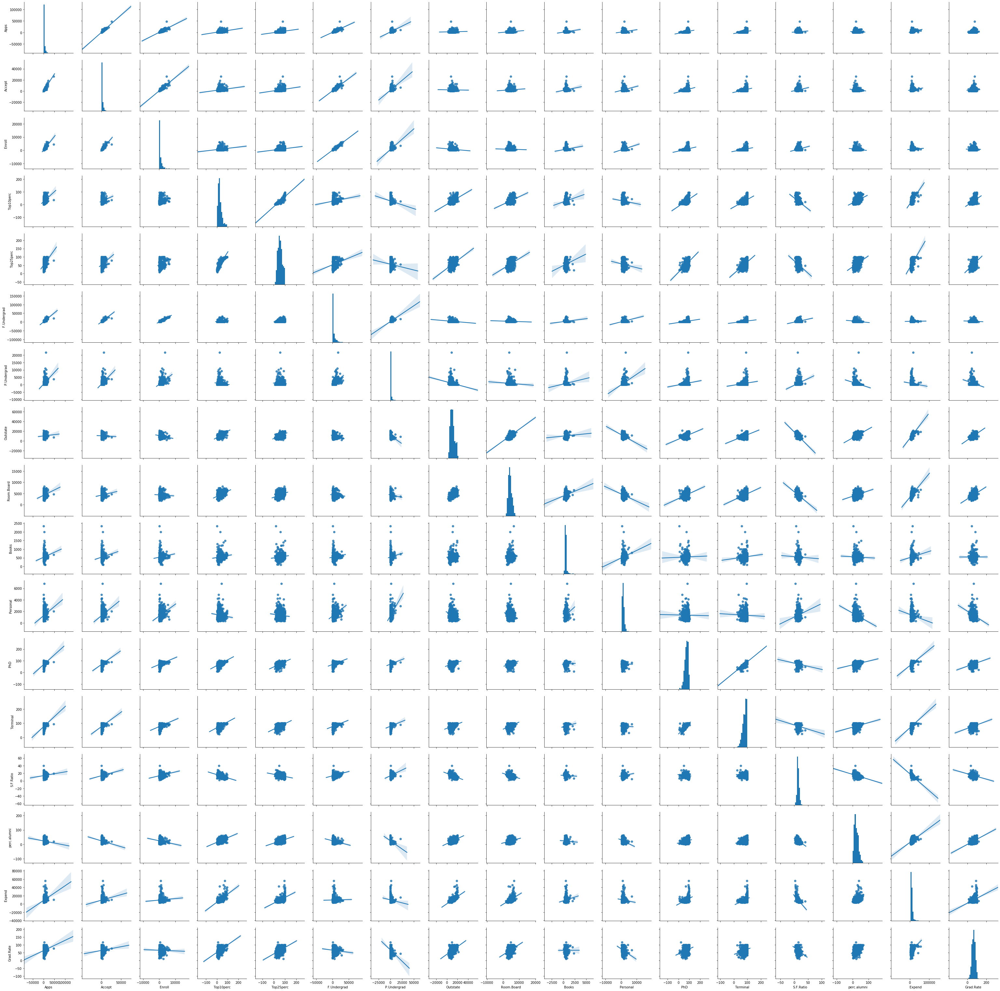

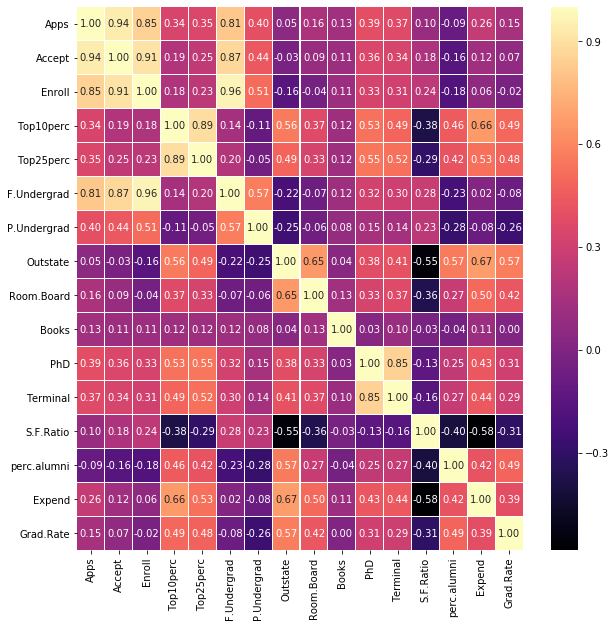

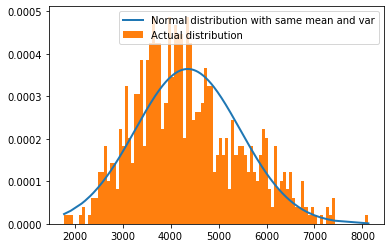

In [65]:
#Importing the libraries
#Basic Stat Analysis
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        
    def statmertic(self,data,colname,colname2):
        print("shape\n",data.shape) # see the shape of the data
        print("Info\n",data.info())
        print("Mean\n",data.mean())
        print("Mode\n",data[colname].mode())
        print("median\n",data.median())
        print("data_quantile(25%):\n",data.quantile(q=0.25))
        print("data_quantile(50%):\n",data.quantile(q=0.50))
        print("data_quantile(75%):\n",data.quantile(q=0.75))
        print("describe\n",data.describe())
        print("IQR"+colname+"\n",data[colname2].quantile(0.75) - data[colname2].quantile(0.25))
        print("IQR\n",data.quantile(0.75) - data.quantile(0.25))
#         print("Range\n",data.max() - data.min())
        print("variance\n",data.var())
        print("std\n",data.std())
        print("cov\n",data.cov())
        print("corr\n",data.corr())
        print("skew\n",data.skew())
        print("kurt\n",data.kurt())
        
        
class Plot(FileRead):
    def histplot(self,data,colname):
        mean=data[colname].mean()
        median=data[colname].median()
        mode=data[colname].mode()
        print('Mean: ',mean,'\nMedian: ',median,'\nMode: ',mode[0])
        plt.figure(figsize=(10,5)) # set the figure size
        plt.hist(data[colname],bins=100,color='lightblue') #Plot the histogram
        plt.axvline(mean,color='green',label='Mean')     # Draw lines on the plot for mean median and the two modes we have in GRE Score
        plt.axvline(median,color='blue',label='Median')
        plt.axvline(mode[0],color='red',label='Mode1')
#         plt.axvline(mode[1],color='red',label='Mode2')
        plt.xlabel(colname)   # label the x-axis
        plt.ylabel('Frequency')   # label the y-axis
        plt.legend()              # Plot the legend
        plt.show()
       
    def boxplot(self,data,colname):
        # Create boxplot for column="mpg"
        data.boxplot(column=colname,return_type='axes',figsize=(8,8))
        # create text(x=0.74, y=22.25, s="3rd Quartile")like Median, 1st Quartile,Min,Max,IQR:
        plt.text(x=0.74, y=data[colname].quantile(q=0.75), s="3rd Quartile")
        plt.text(x=0.8, y=data[colname].quantile(q=0.50), s="Median")
        plt.text(x=0.75, y=data[colname].quantile(q=0.25), s="1st Quartile")
        plt.text(x=0.9, y=data[colname].min(), s="Min")
        plt.text(x=0.9, y=data[colname].max(), s="Max")
        plt.text(x=0.7, y=data[colname].quantile(0.75) - data[colname].quantile(0.25), s="IQR", rotation=90, size=25)
        
    def pairplot(self,data):
        sns.pairplot(data, kind="reg")  # plots scatter plots for every pair of attributes and histograms along the diagonal
        plt.show()

    def heatmap(self,data,dropcol):
        data.drop(dropcol, axis=1, inplace=True)
        fig,ax = plt.subplots(figsize=(10, 10))   
        sns.heatmap(data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma") # the color intensity is based on 
        plt.show()
        
    def normalplot(self,data,colname):
            #convert pandas DataFrame object to numpy array and sort
        h = np.asarray(data[colname])
        h = sorted(h)
        #use the scipy stats module to fit a normal distirbution with same mean and standard deviation
        fit = stats.norm.pdf(h, np.mean(h), np.std(h)) 
        #plot both series on the histogram
        plt.plot(h,fit,'-',linewidth = 2,label="Normal distribution with same mean and var")
        plt.hist(h,normed=True,bins = 100,label="Actual distribution")      
        plt.legend()
        plt.show()


        
d=Plot()
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv")
d.statmertic(data,'Room.Board','Outstate')
d.histplot(data,'Room.Board')
d.boxplot(data,'Personal')
d.pairplot(data)
d.heatmap(data,'Personal')
d.normalplot(data,'Room.Board')

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

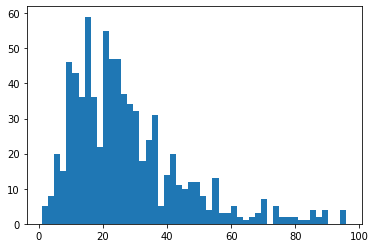

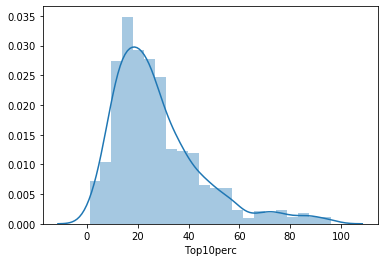

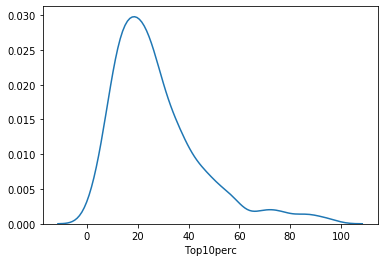

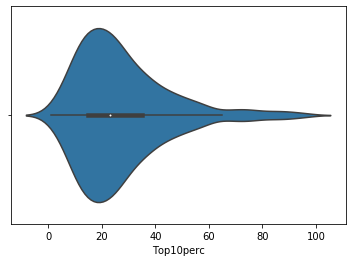

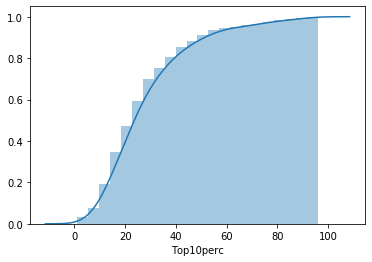

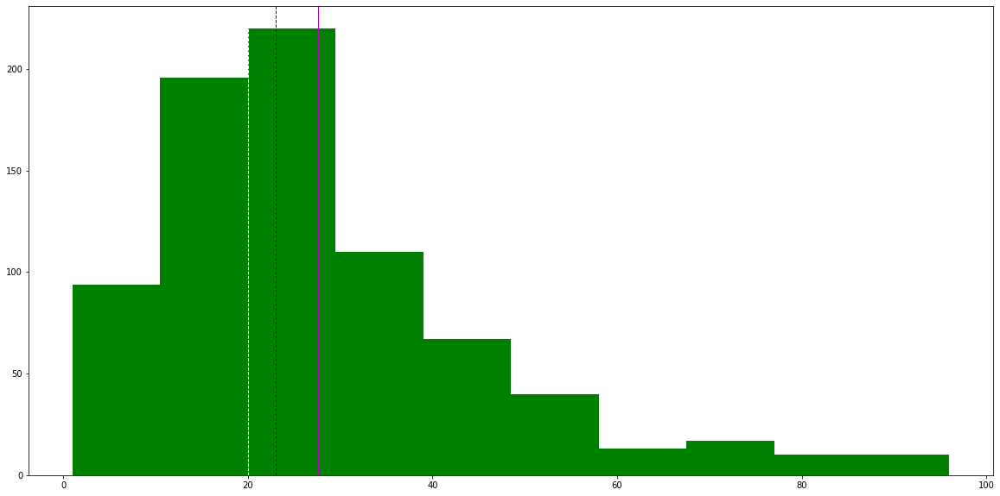

In [25]:
#Importing the libraries
#Univariate Analysis
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA

class FileRead:
    def readingfile(self,filepath,colname):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        data = data[colname]
        data=data.dropna()
    def statmertic(self,data):
        print("length\n",len(data))
        print("isnullsum\n",data.isnull().sum())
        print("skew\n",data.skew())
        print("kurt\n",data.kurt())
        
       
        
        
class Plot(FileRead):
    def histdistplot(self,data):
        plt.hist(data, bins=50)
        plt.show()
        sns.distplot(data)
        plt.show()
        sns.distplot(data, hist=False)
        plt.show()
        sns.violinplot(data)
        plt.show()
        sns.distplot(data, hist_kws=dict(cumulative=True), kde_kws=dict(cumulative=True))
        plt.show()
       
    def histplotwithstat(self,data):
        plt.figure(figsize=(20,10)) # makes the plot wider
        plt.hist(data, color='g') # plots a simple histogram
        plt.axvline(data.mean(), color='m', linewidth=1)
        plt.axvline(data.median(), color='b', linestyle='dashed', linewidth=1)
        plt.axvline(data.mode()[0], color='w', linestyle='dashed', linewidth=1)      
        
d=Plot()
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Top10perc")
d.statmertic(data)
d.histdistplot(data)
d.histplotwithstat(data)

['Names' 'Apps' 'Accept' 'Enroll' 'Top10perc' 'Top25perc' 'F.Undergrad'
 'P.Undergrad' 'Outstate' 'Room.Board' 'Books' 'Personal' 'PhD' 'Terminal'
 'S.F.Ratio' 'perc.alumni' 'Expend' 'Grad.Rate']
Analysis of Column name Apps
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      11

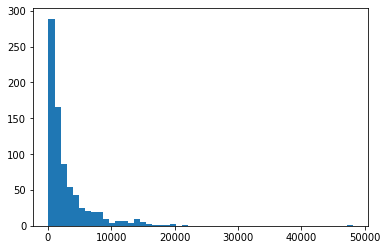

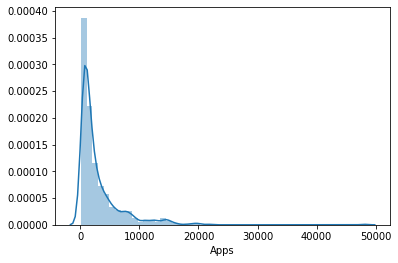

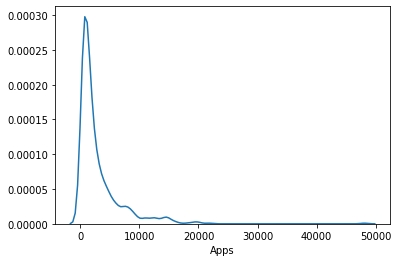

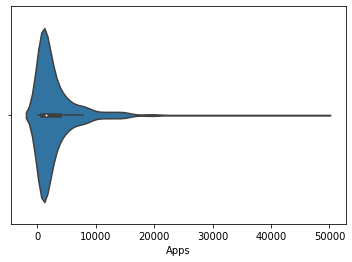

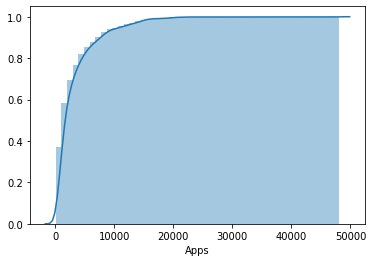

Analysis of Column name Accept
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alu

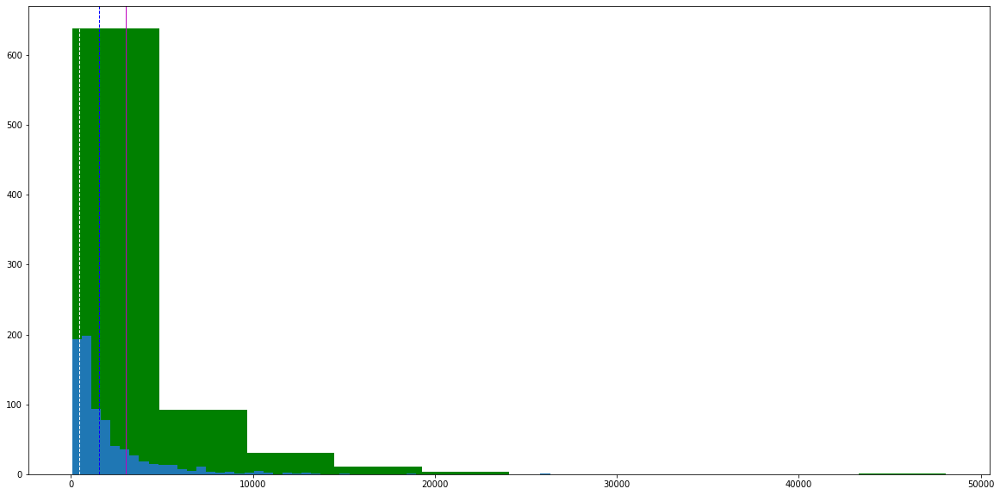

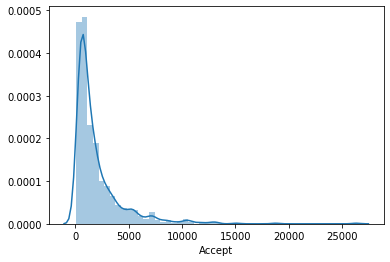

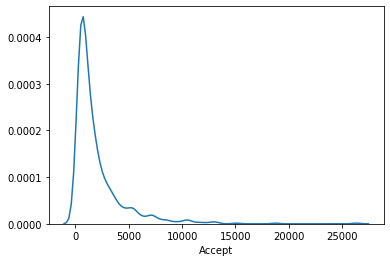

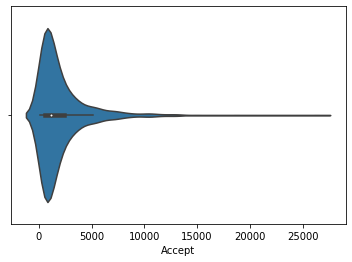

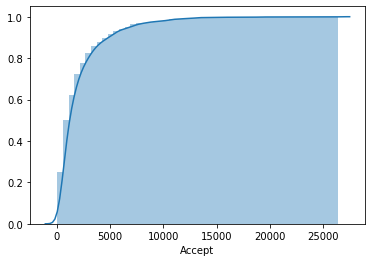

Analysis of Column name Enroll
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alu

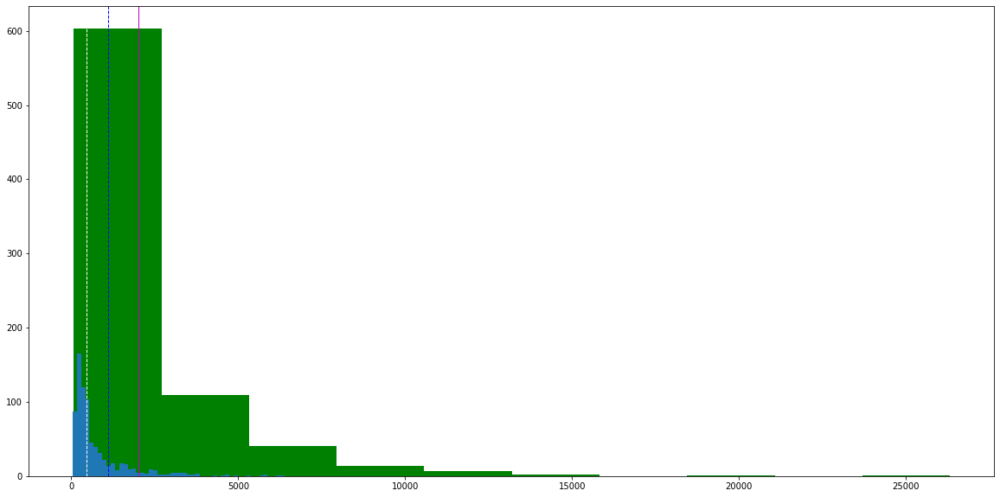

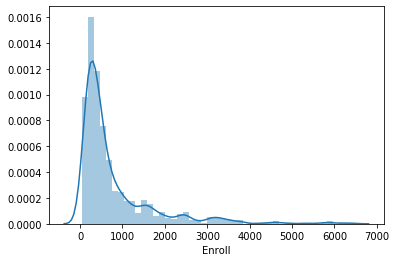

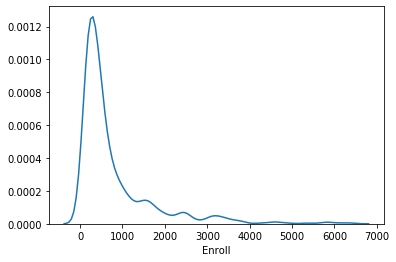

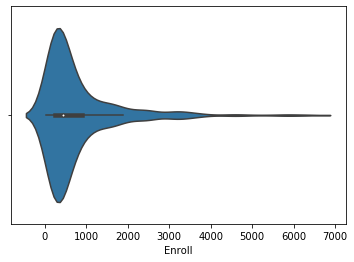

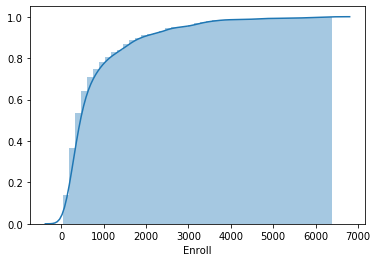

Analysis of Column name Top10perc
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.

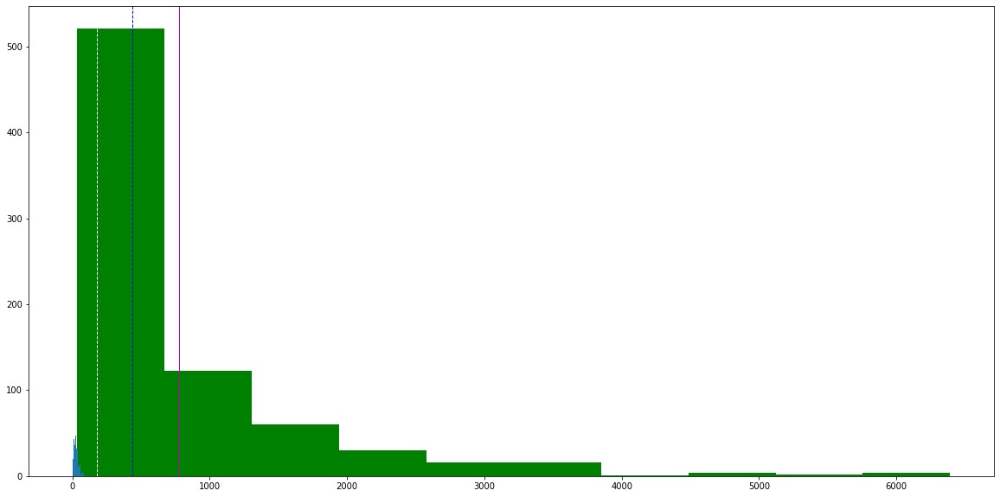

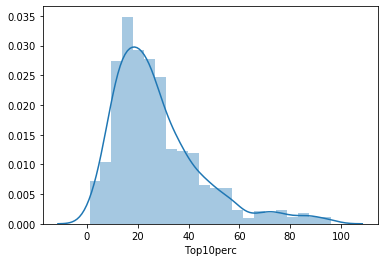

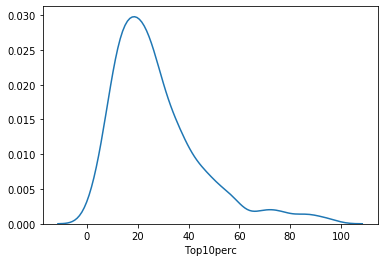

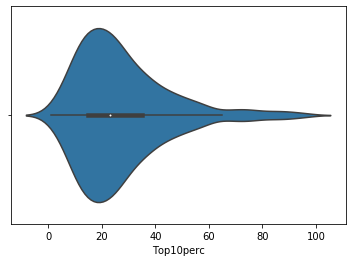

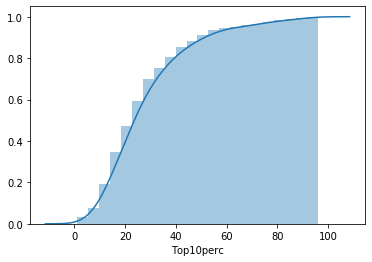

Analysis of Column name Top25perc
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.

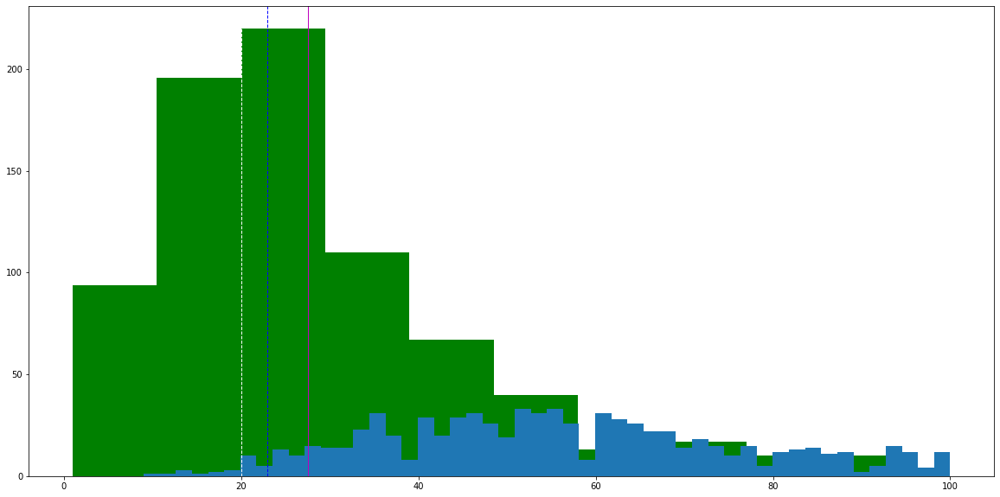

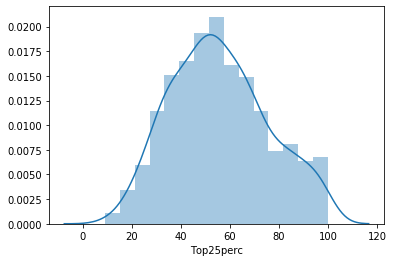

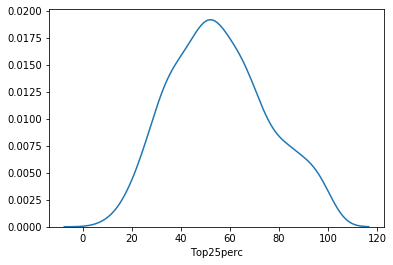

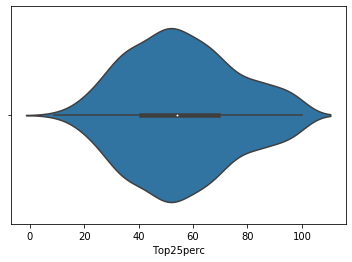

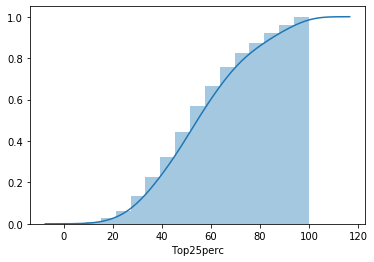

Analysis of Column name F.Undergrad
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  per

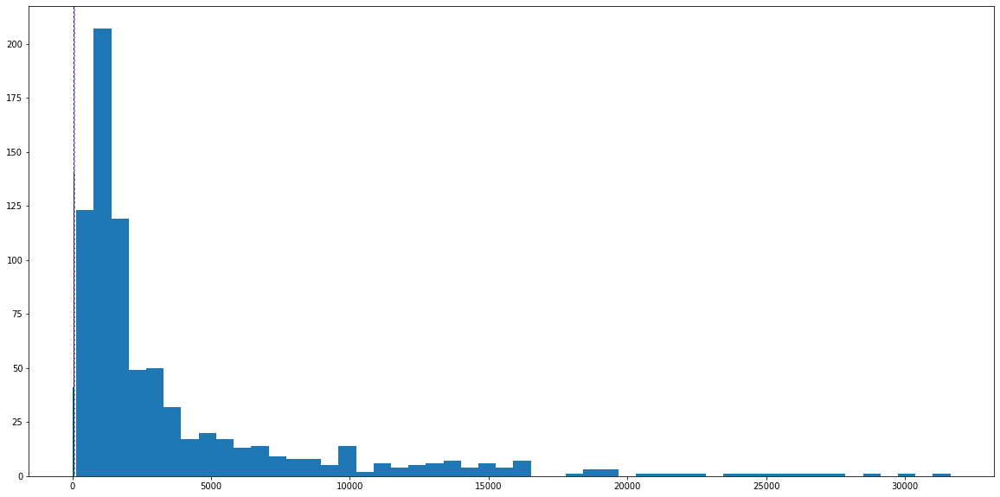

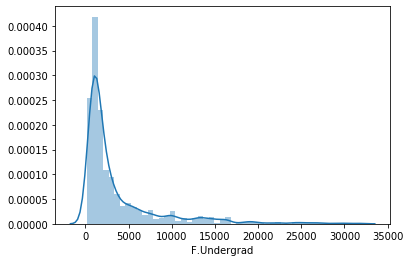

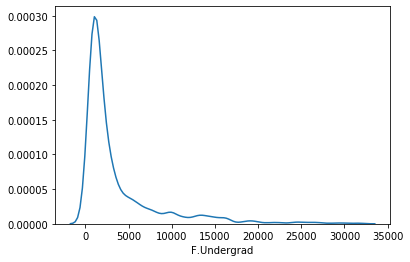

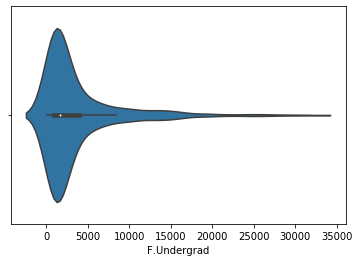

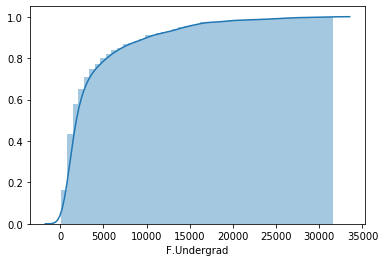

Analysis of Column name P.Undergrad
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  per

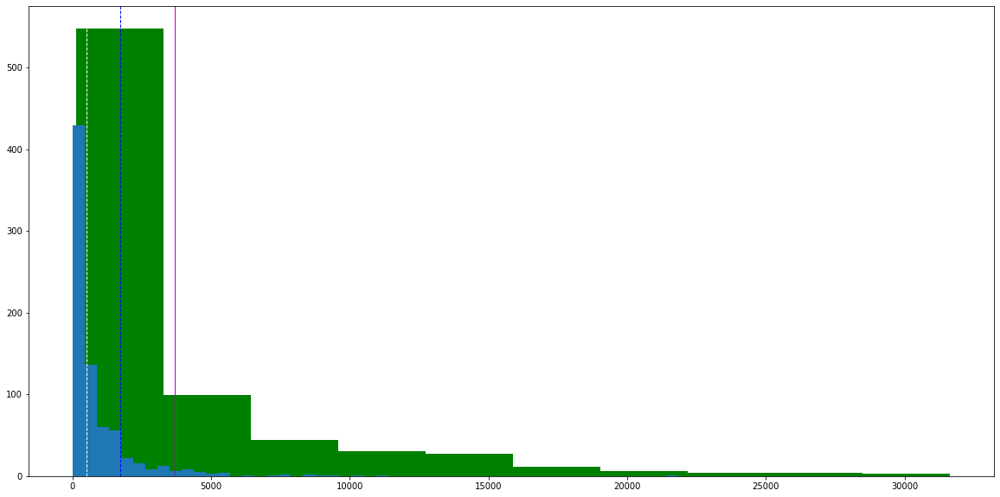

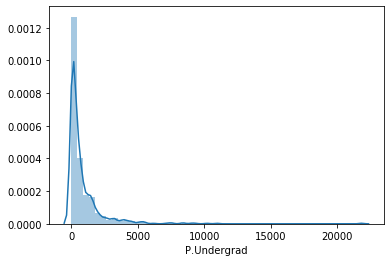

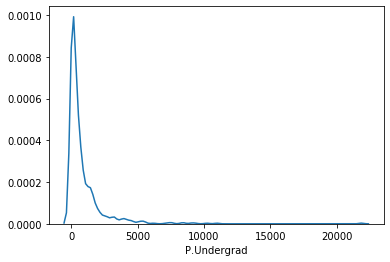

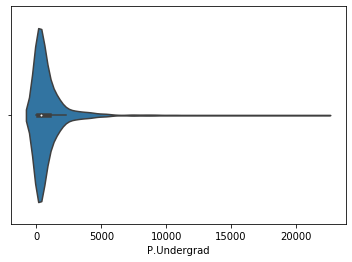

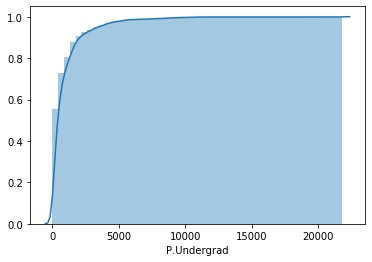

Analysis of Column name Outstate
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.a

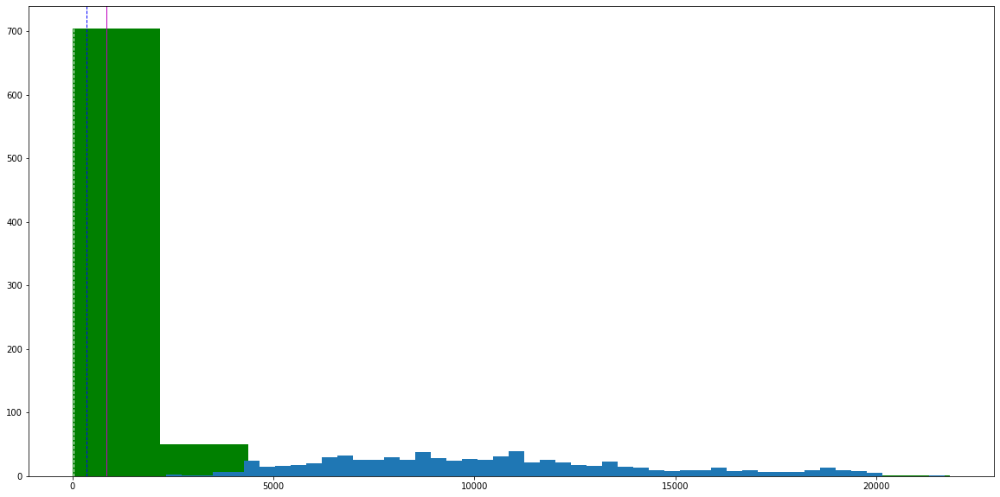

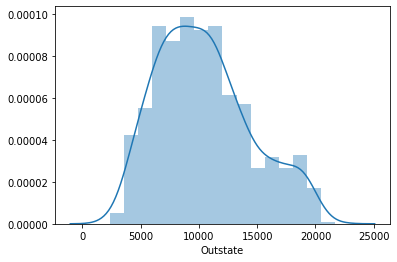

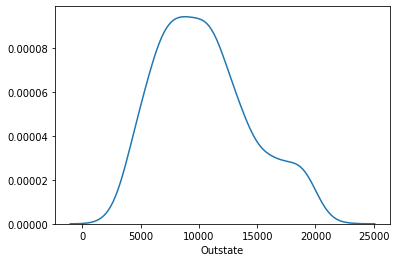

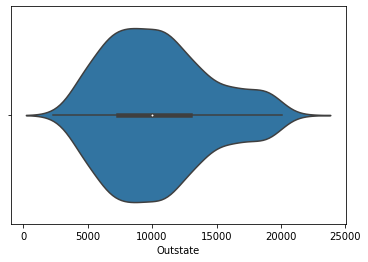

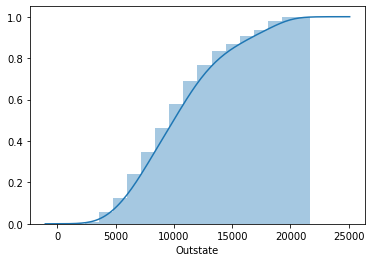

Analysis of Column name Room.Board
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc

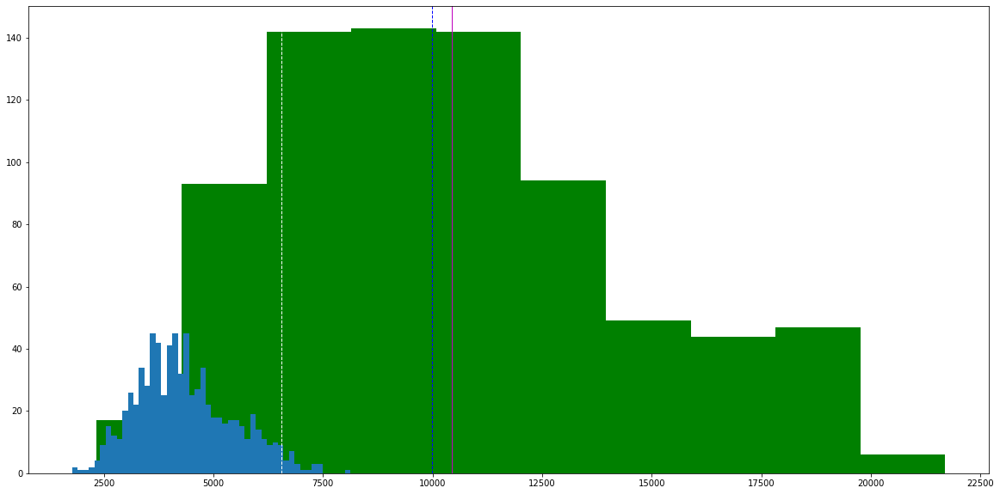

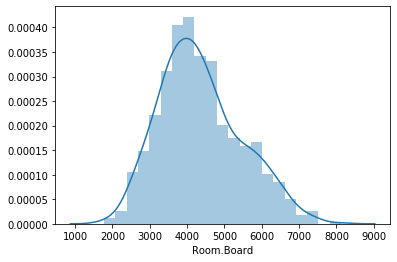

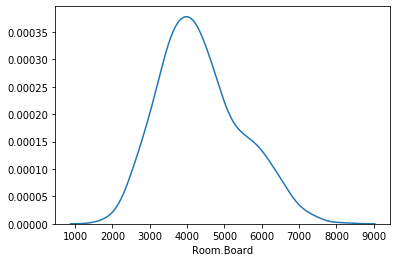

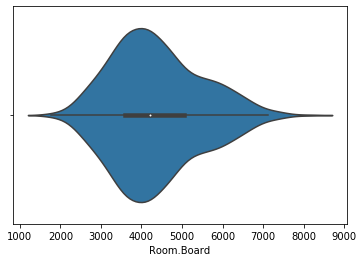

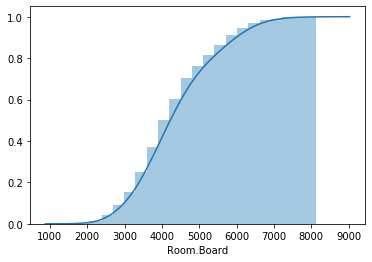

Analysis of Column name Books
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alum

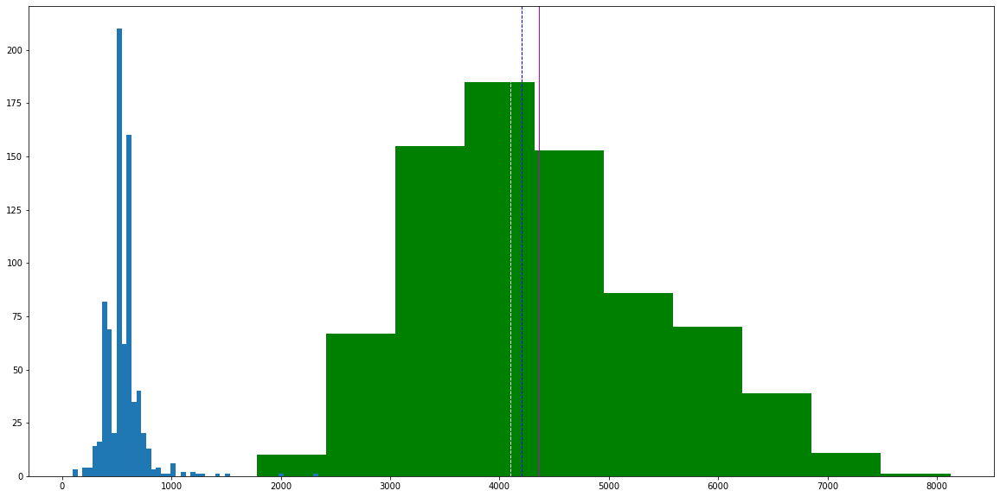

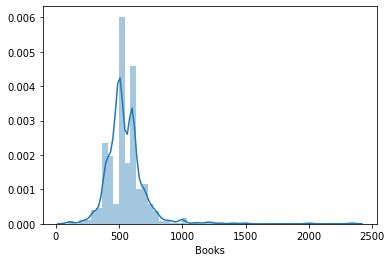

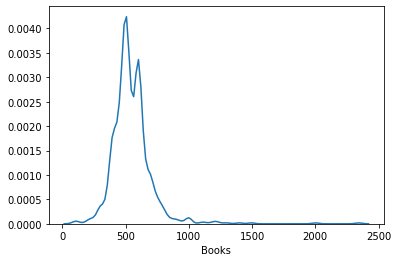

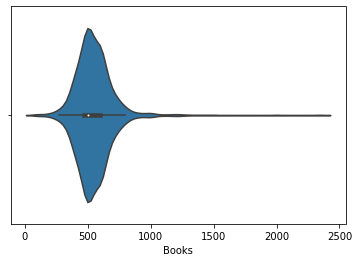

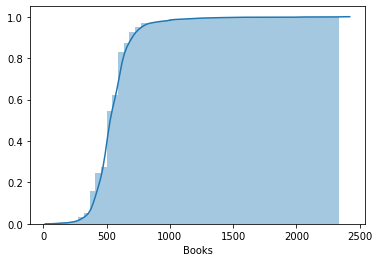

Analysis of Column name Personal
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.a

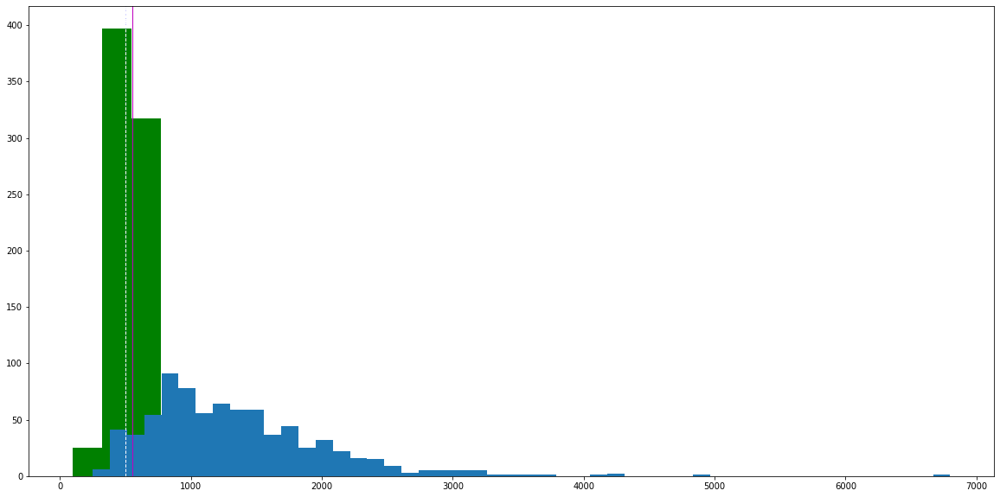

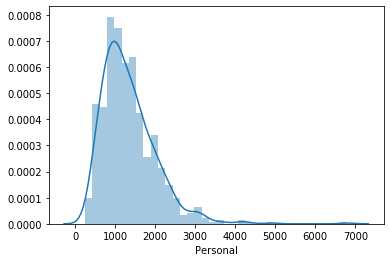

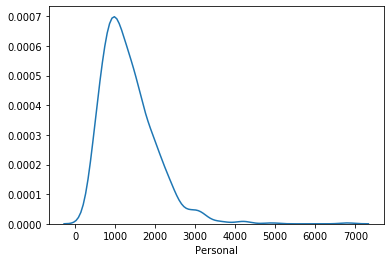

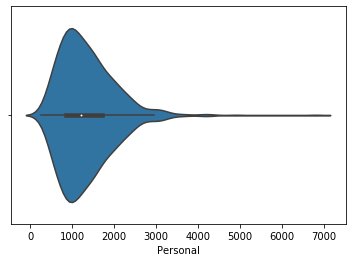

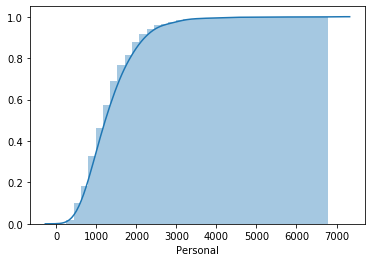

Analysis of Column name PhD
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni

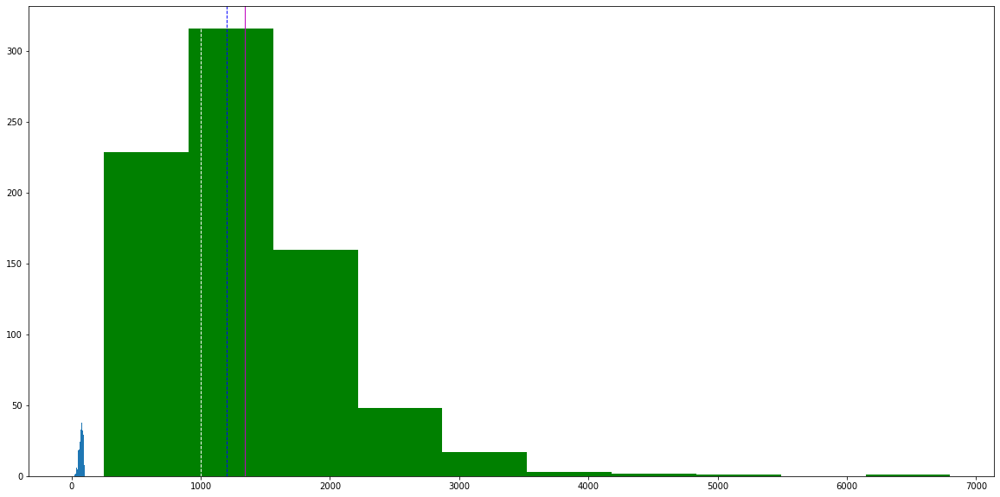

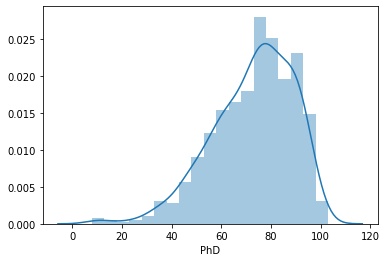

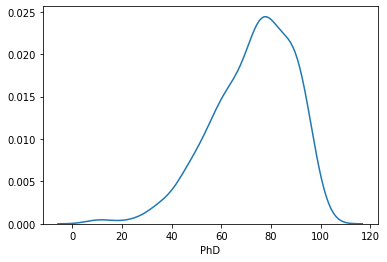

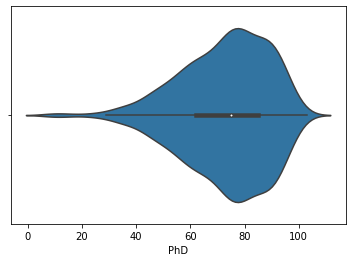

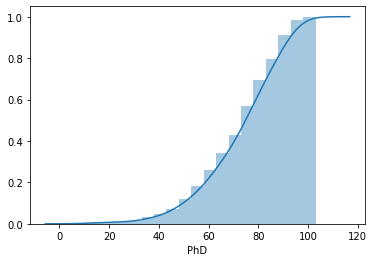

Analysis of Column name Terminal
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.a

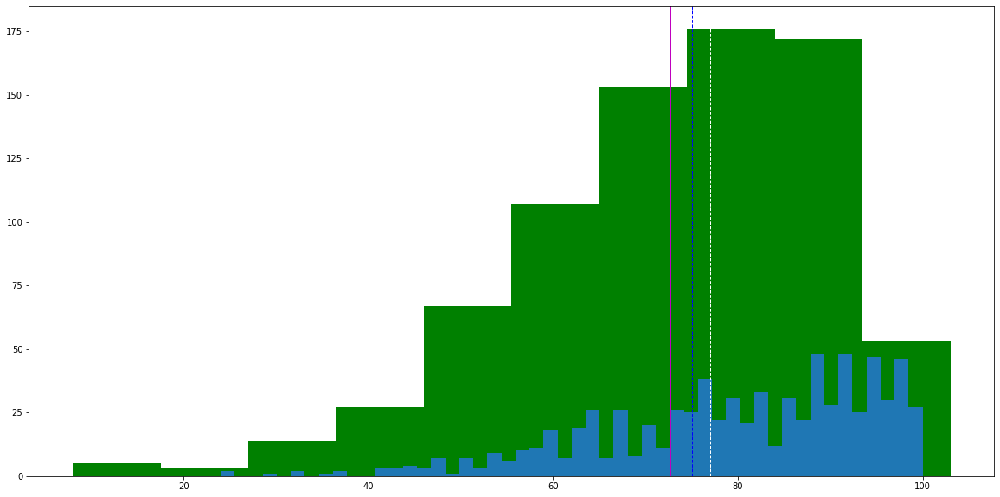

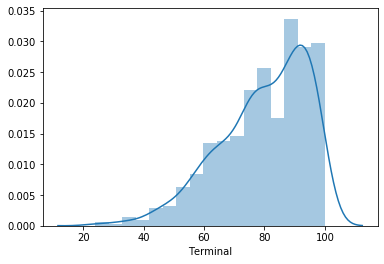

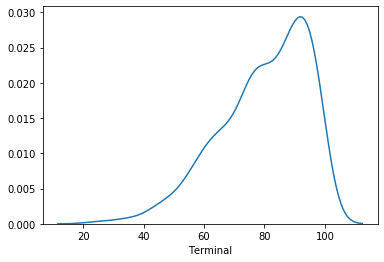

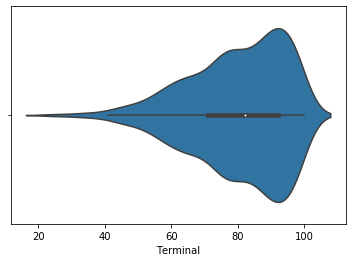

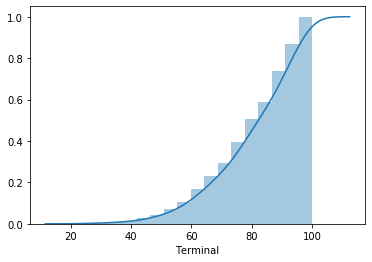

Analysis of Column name S.F.Ratio
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.

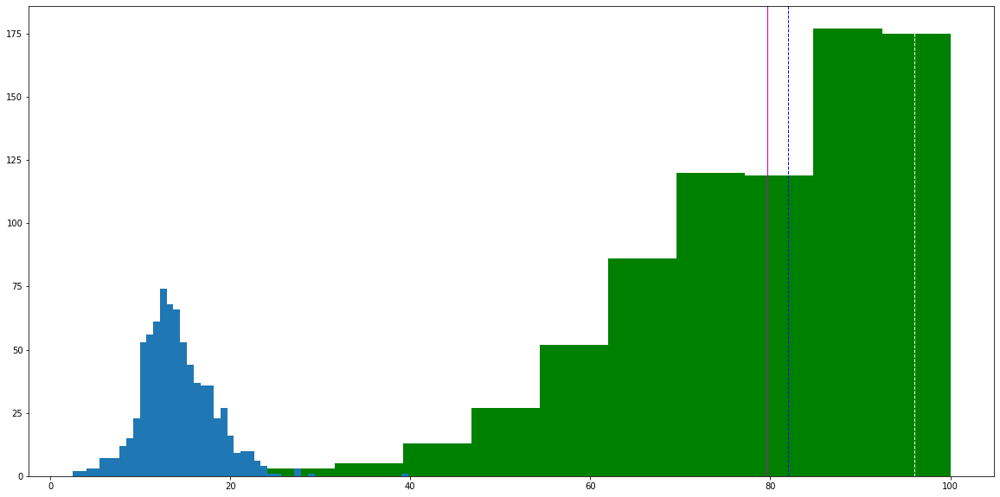

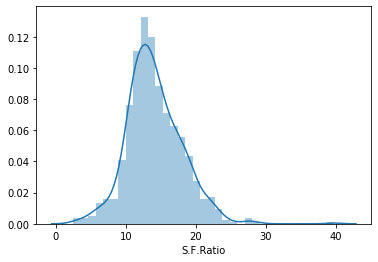

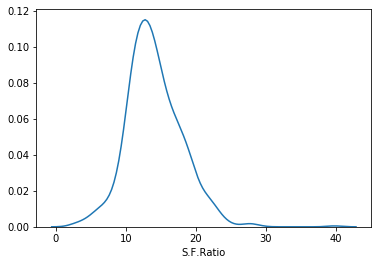

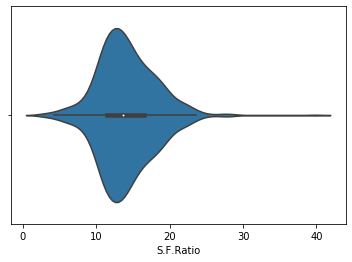

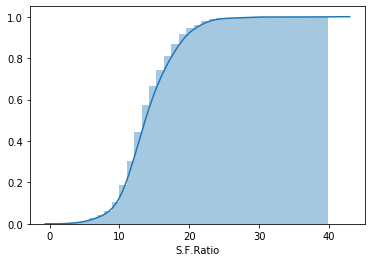

Analysis of Column name perc.alumni
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  per

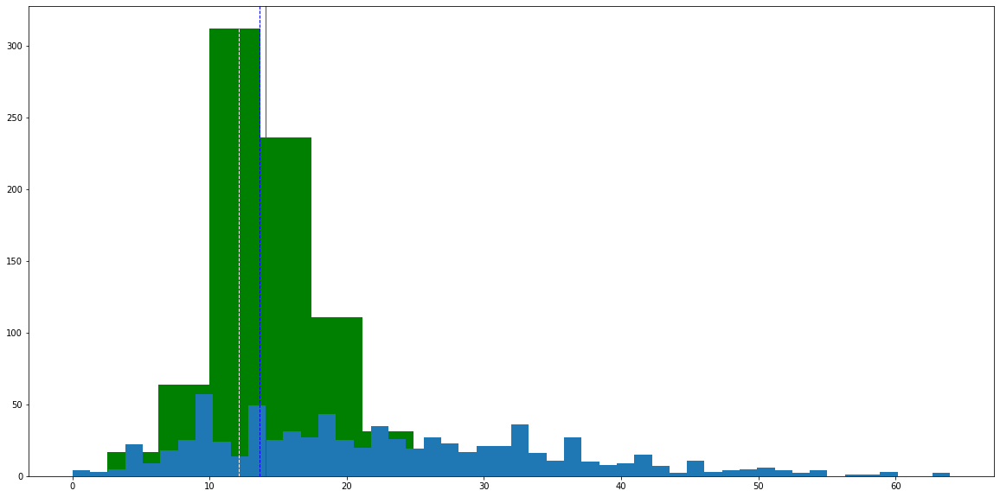

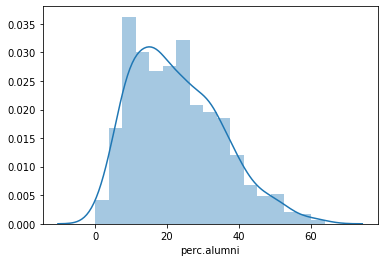

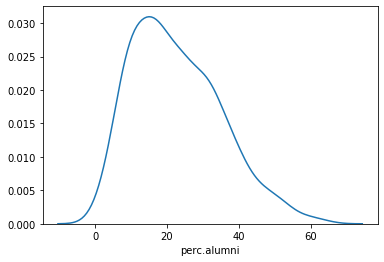

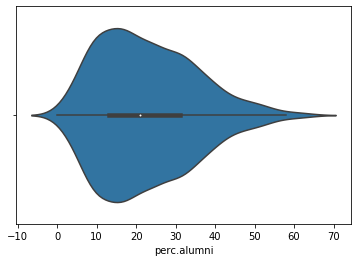

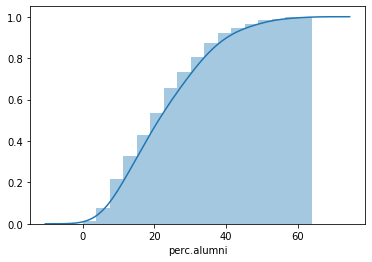

Analysis of Column name Expend
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alu

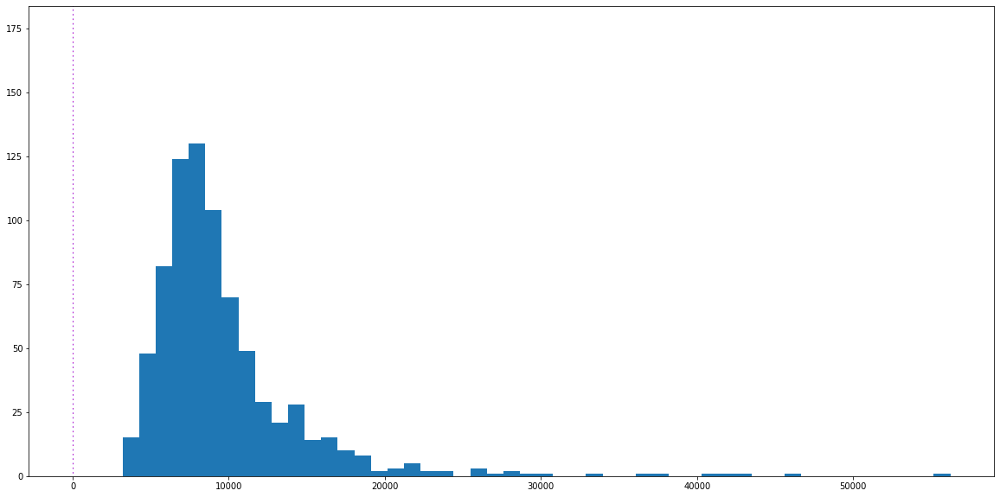

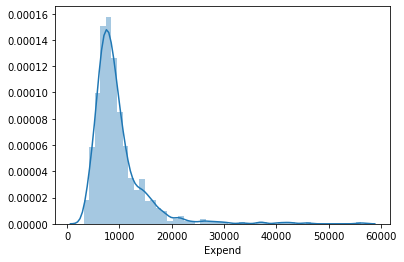

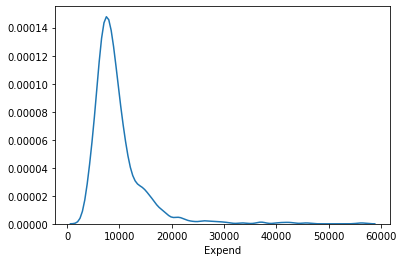

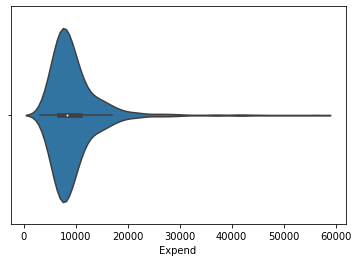

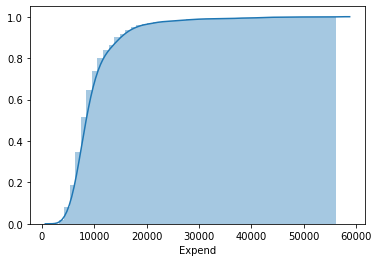

Analysis of Column name Grad.Rate
Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.

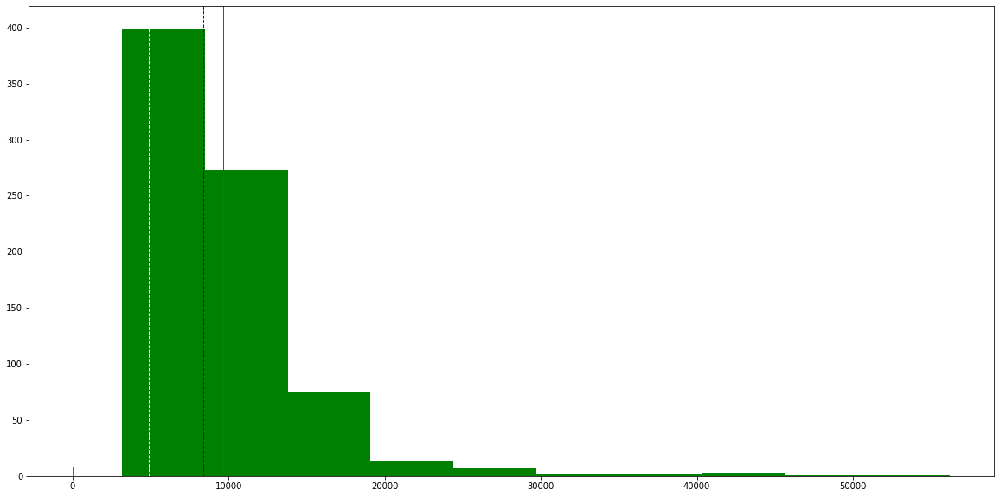

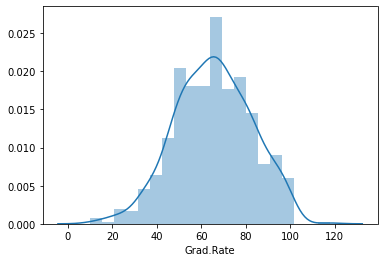

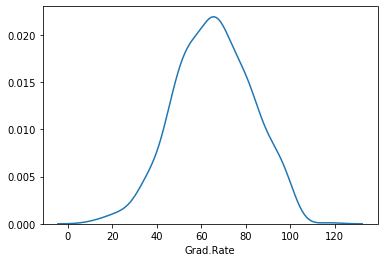

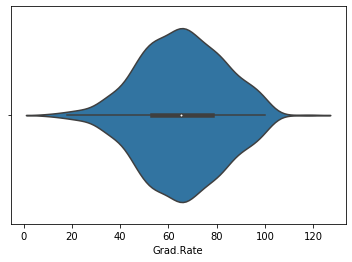

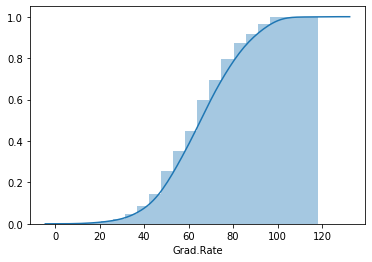

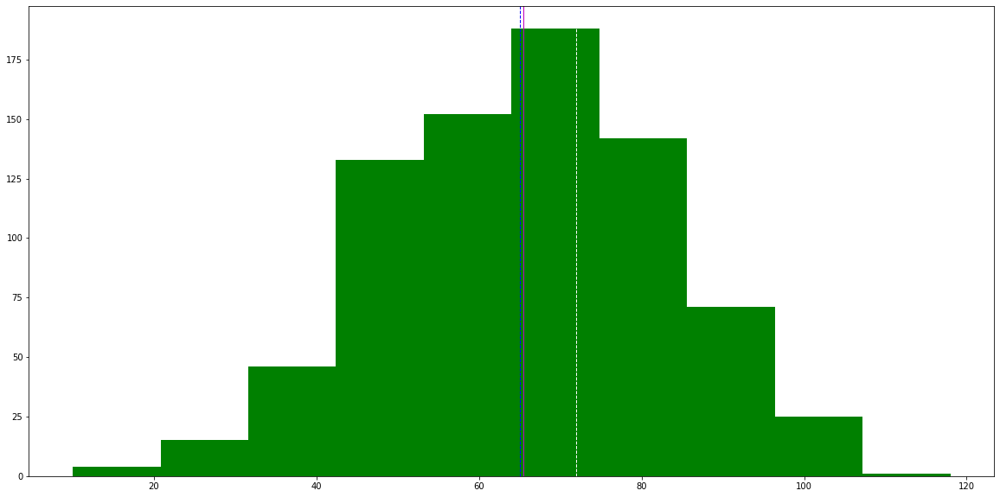

In [27]:
#Univariate Analysis
data=pd.read_csv("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv")
colname=data.columns.values
print(colname)
for i in range(1,18):
    d=Plot()
    print("Analysis of Column name " +colname[i])
    d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv",colname[i])
    d.statmertic(data)
    d.histdistplot(data)
    d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

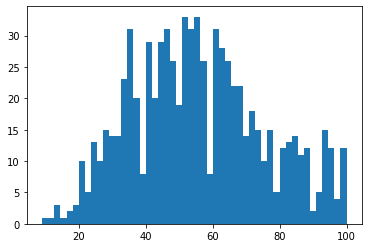

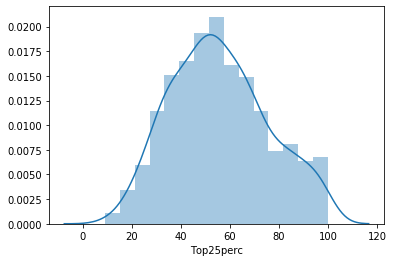

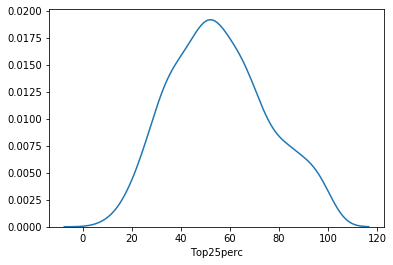

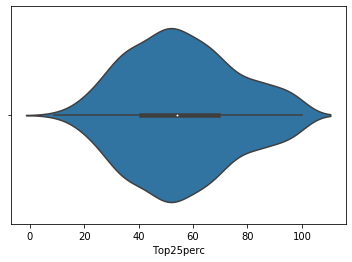

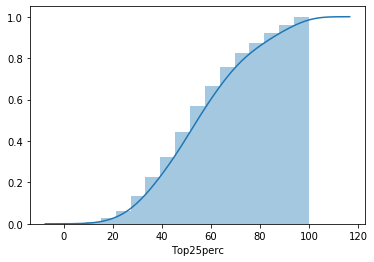

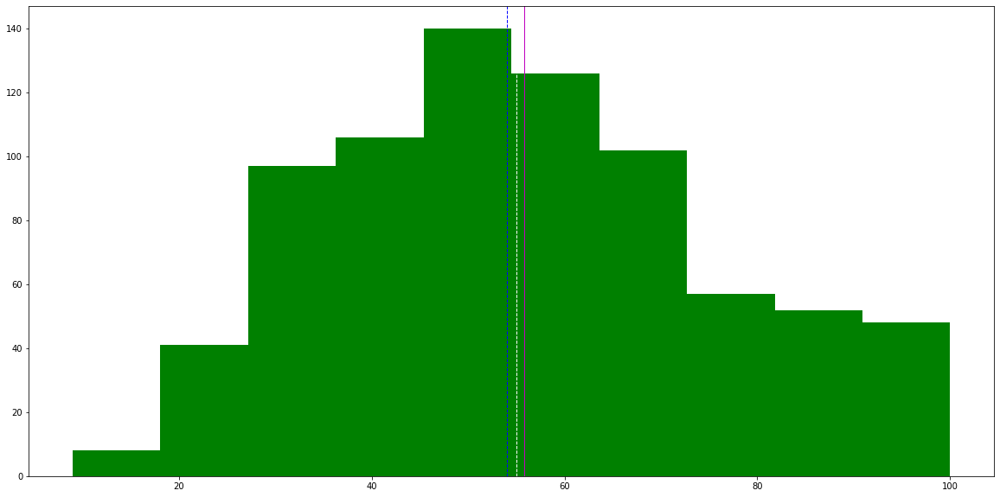

In [9]:
d.readingfile("D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv","Top25perc")
d.statmertic(data)
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

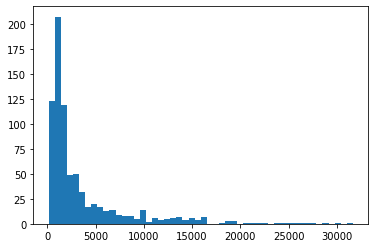

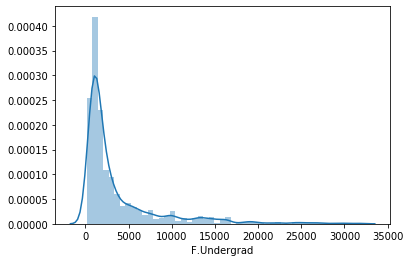

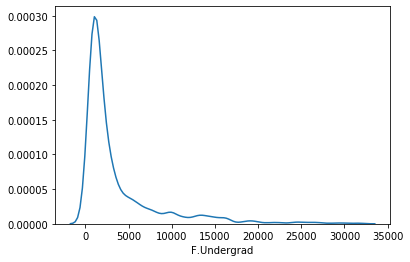

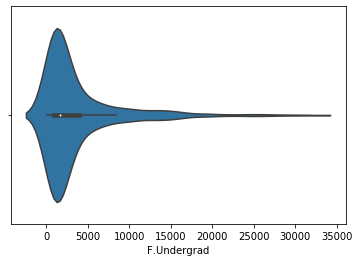

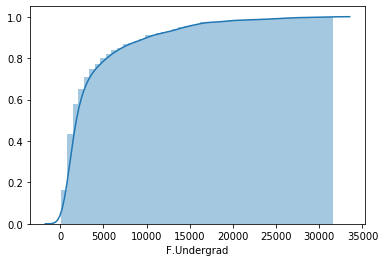

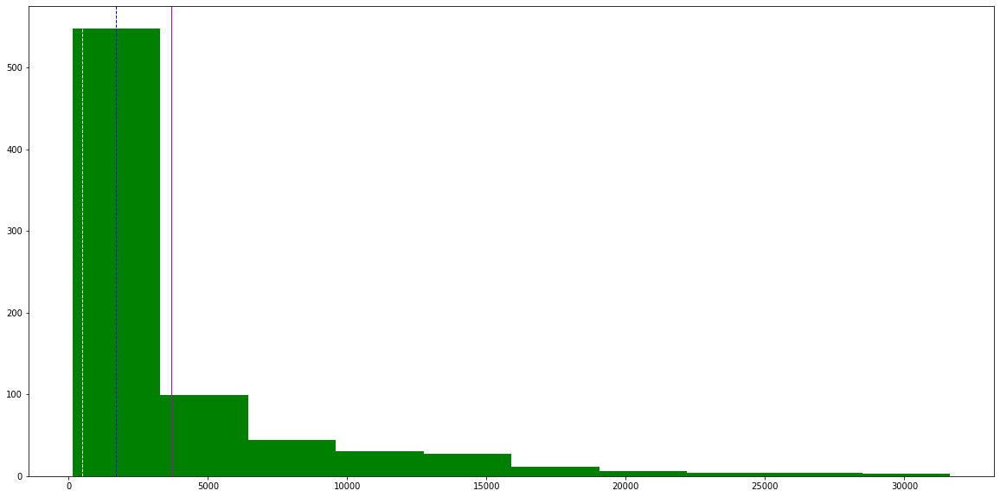

In [6]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","F.Undergrad")
d.statmertic(data)
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

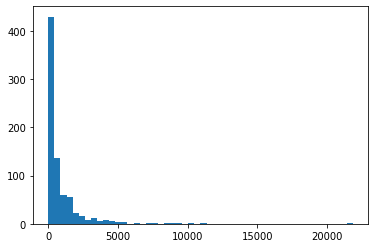

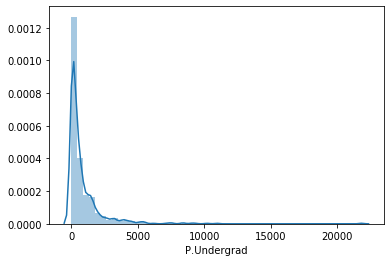

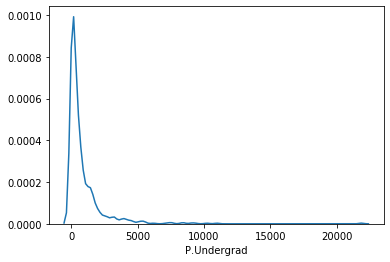

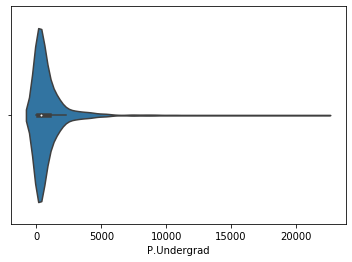

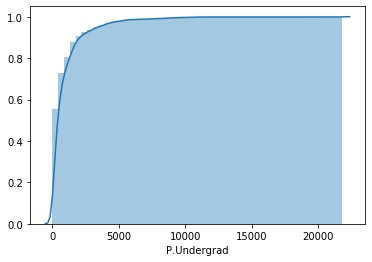

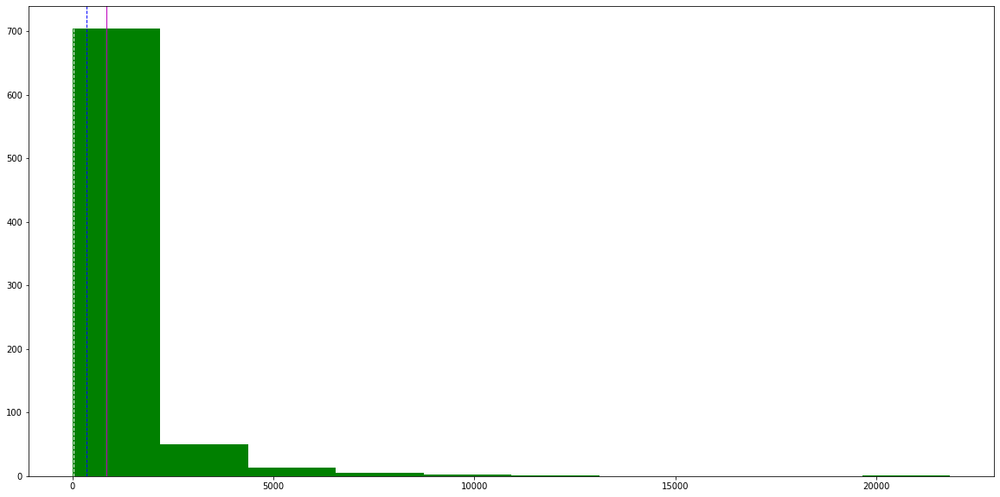

In [19]:
d.readingfile("D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv","P.Undergrad")
d.statmertic(data)
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

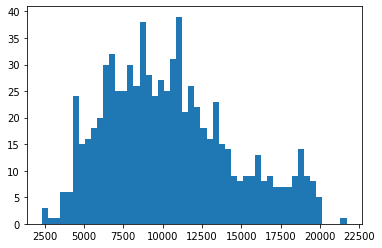

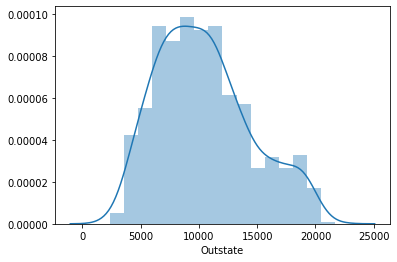

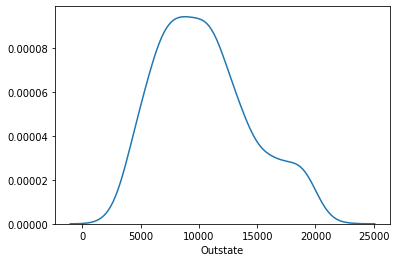

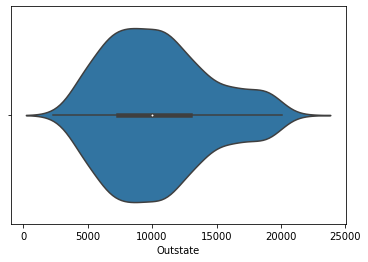

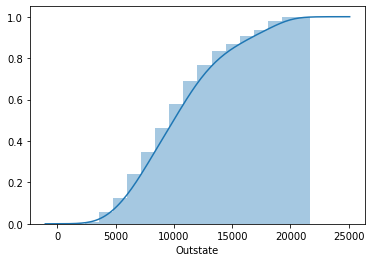

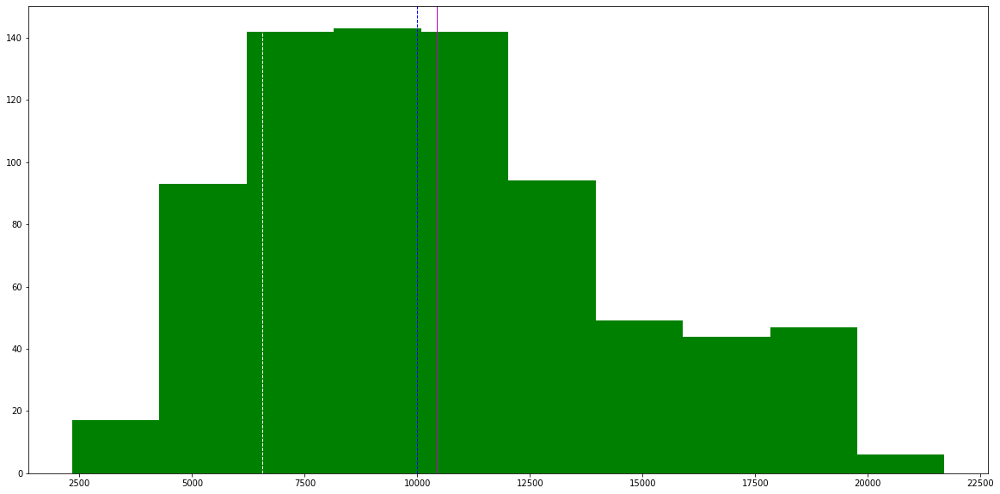

In [7]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Outstate")
d.statmertic(data)
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

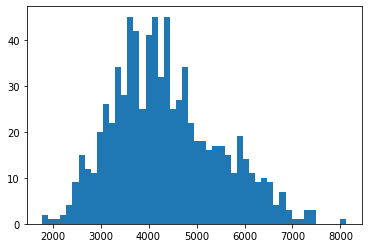

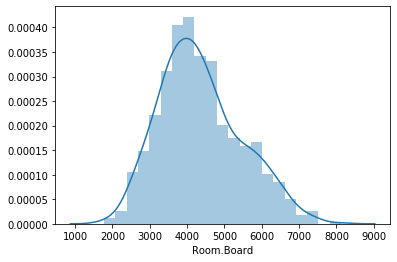

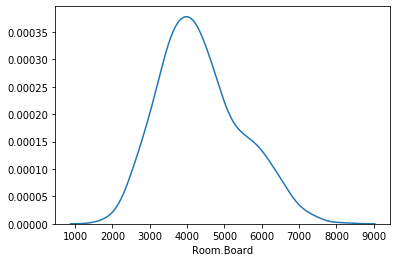

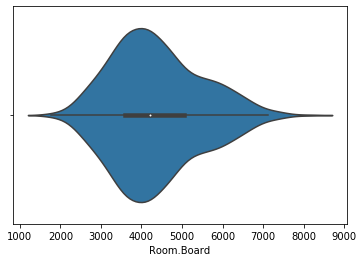

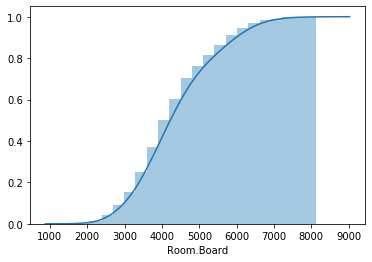

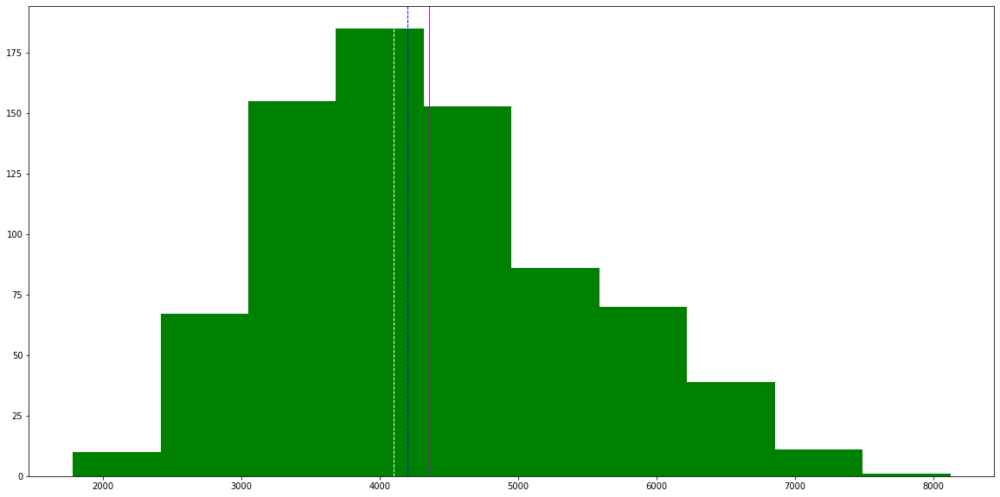

In [8]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Room.Board")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

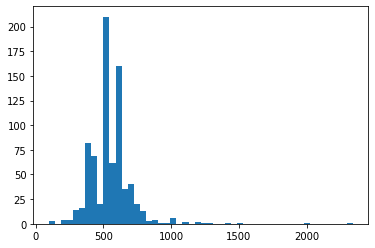

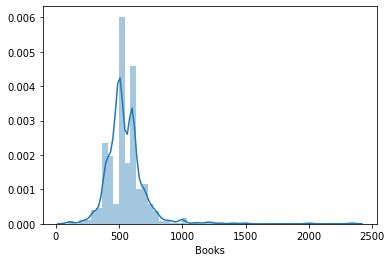

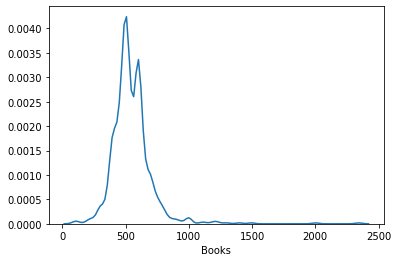

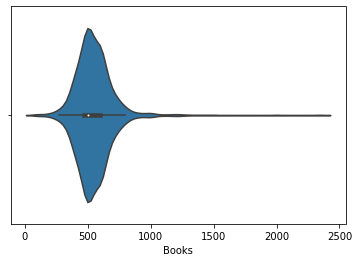

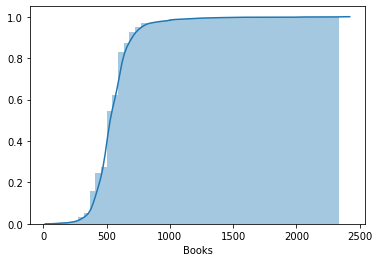

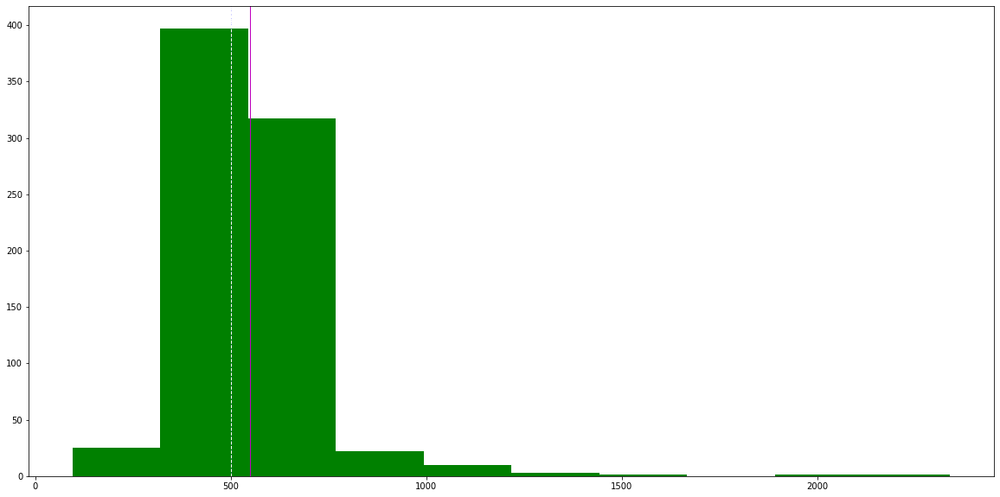

In [9]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Books")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

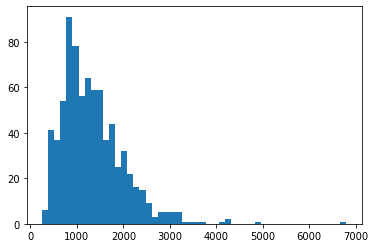

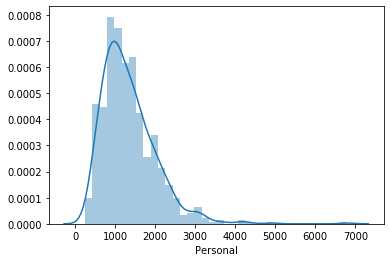

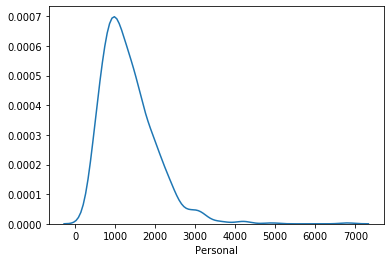

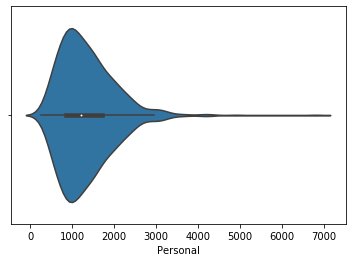

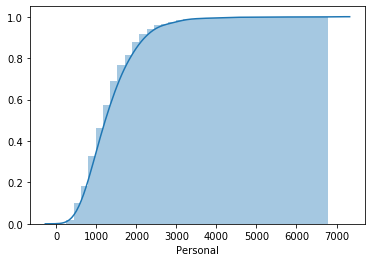

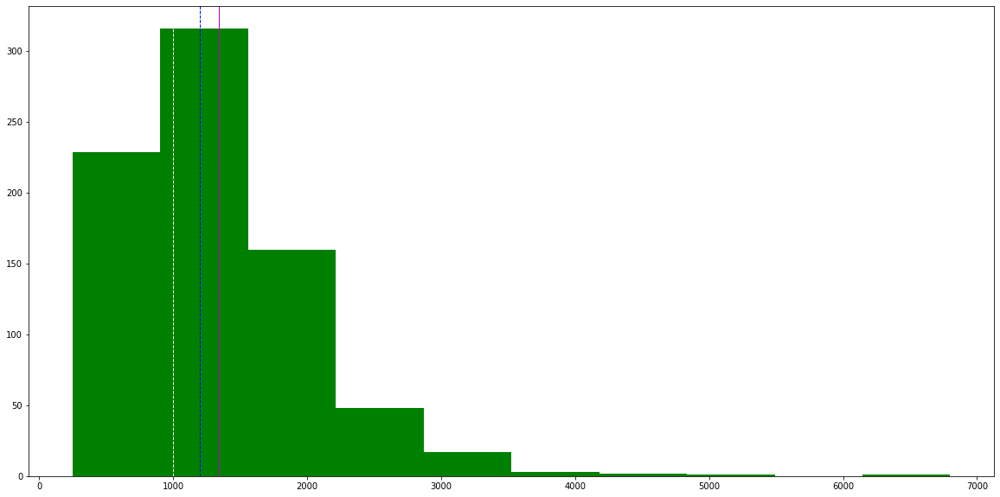

In [10]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Personal")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

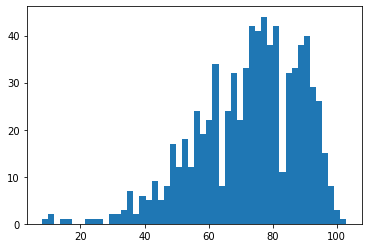

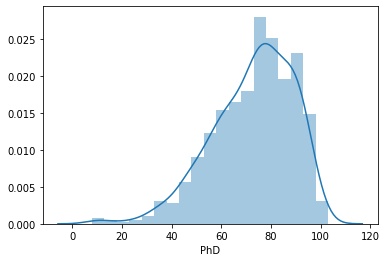

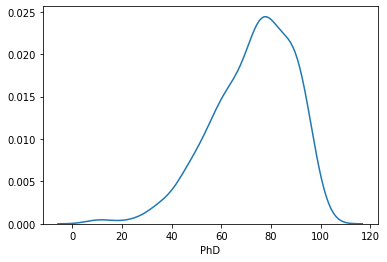

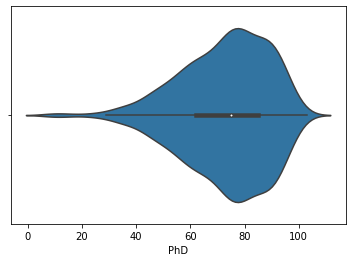

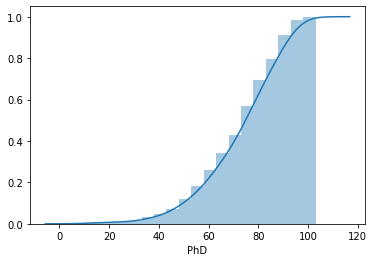

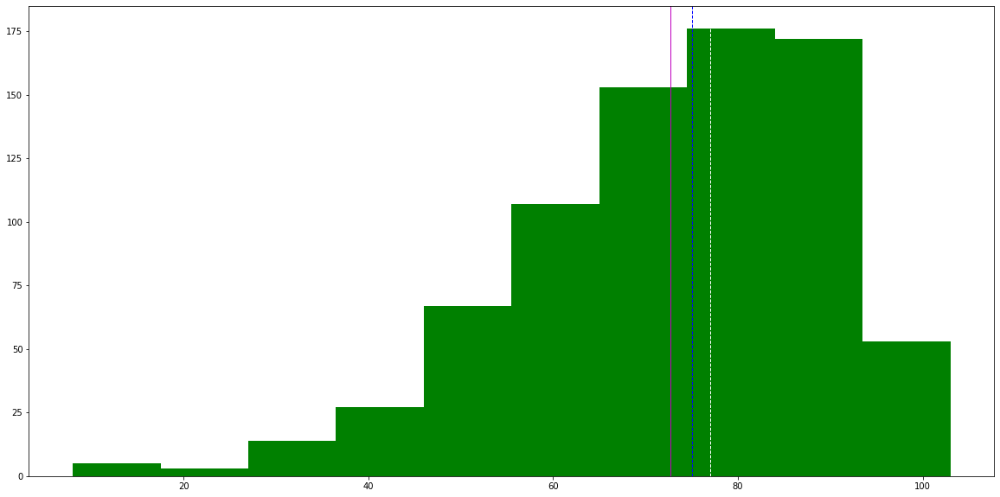

In [11]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","PhD")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

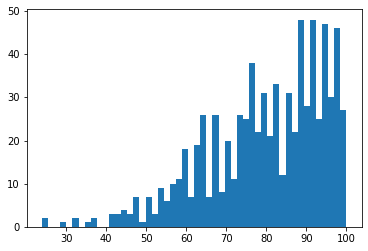

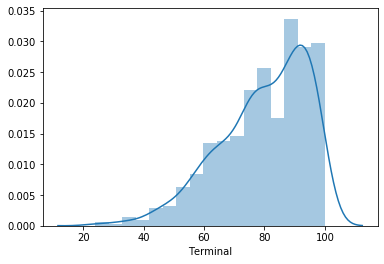

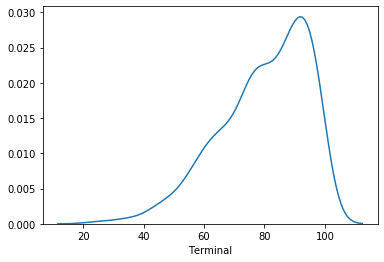

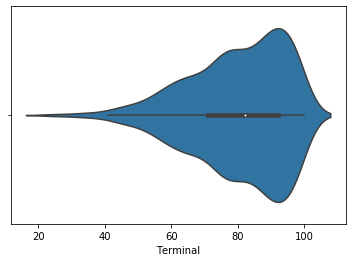

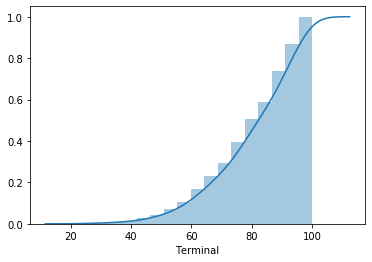

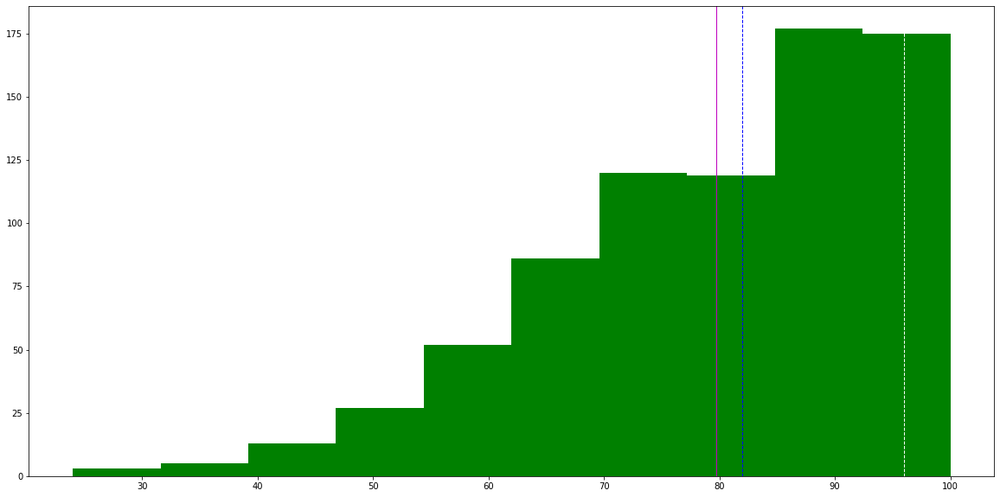

In [12]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Terminal")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

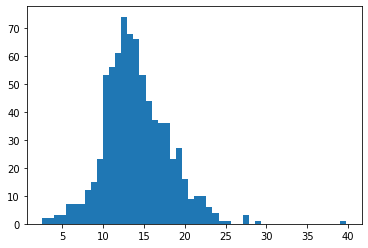

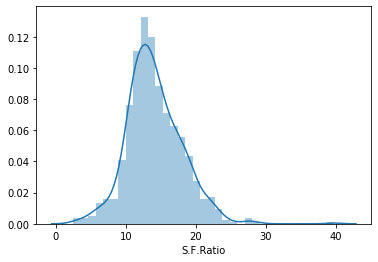

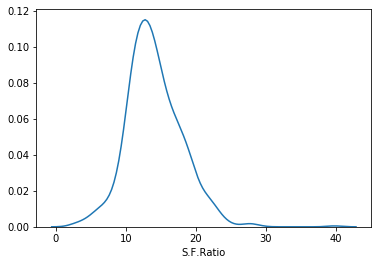

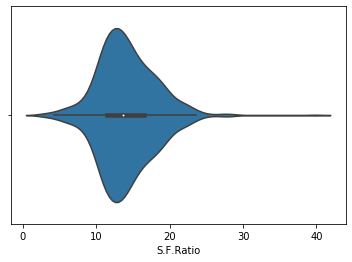

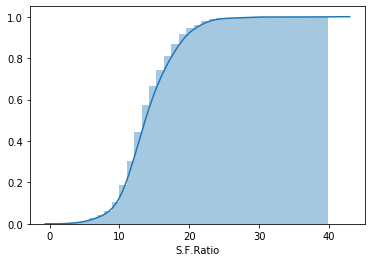

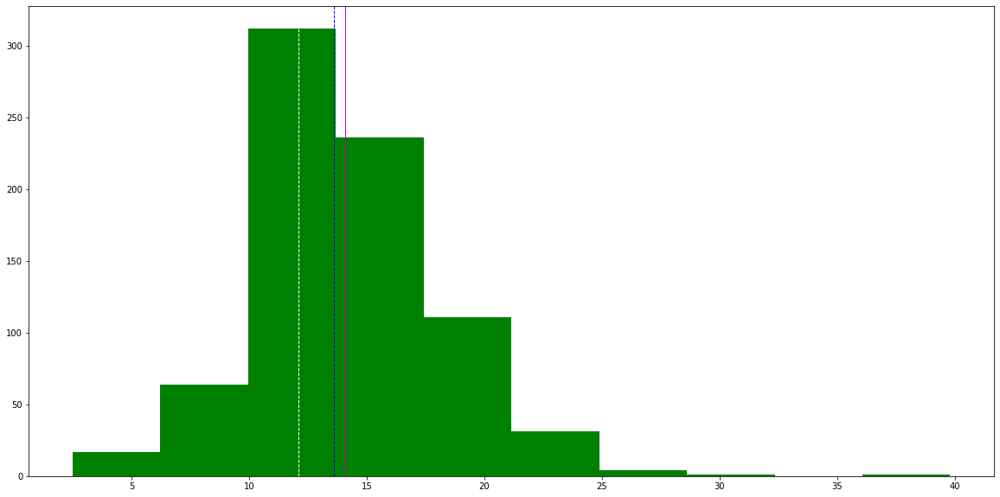

In [13]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","S.F.Ratio")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

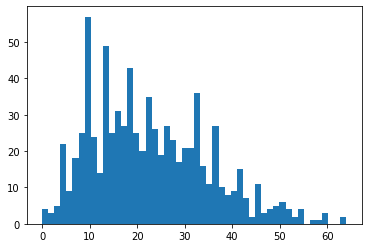

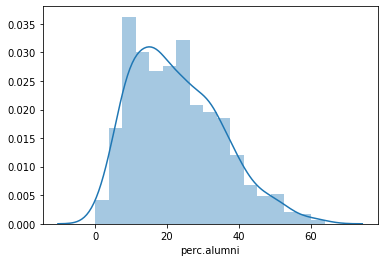

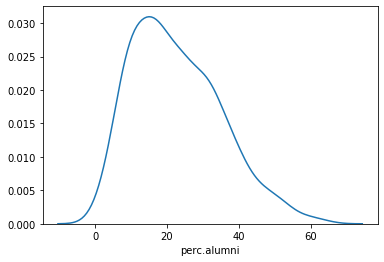

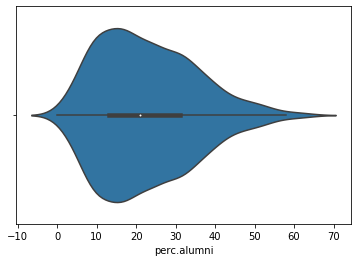

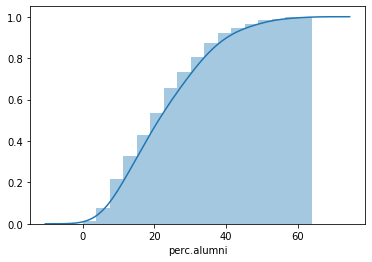

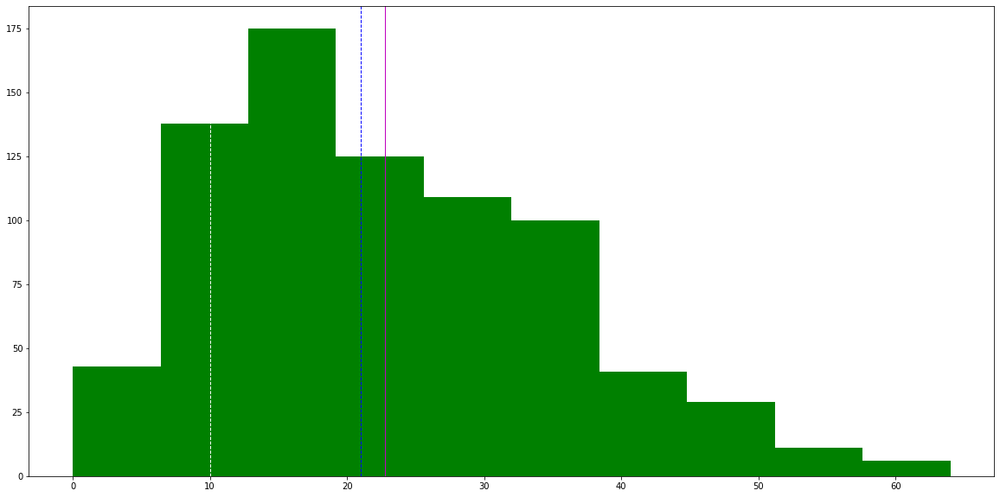

In [14]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","perc.alumni")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

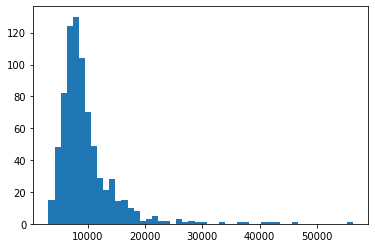

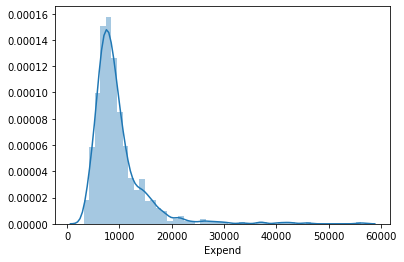

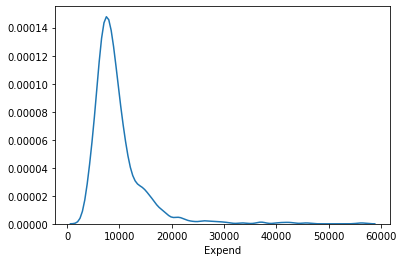

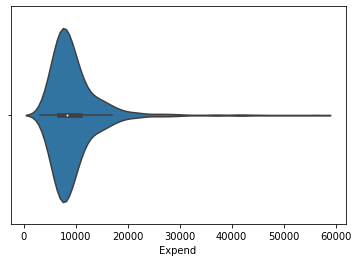

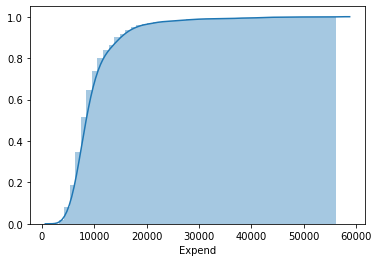

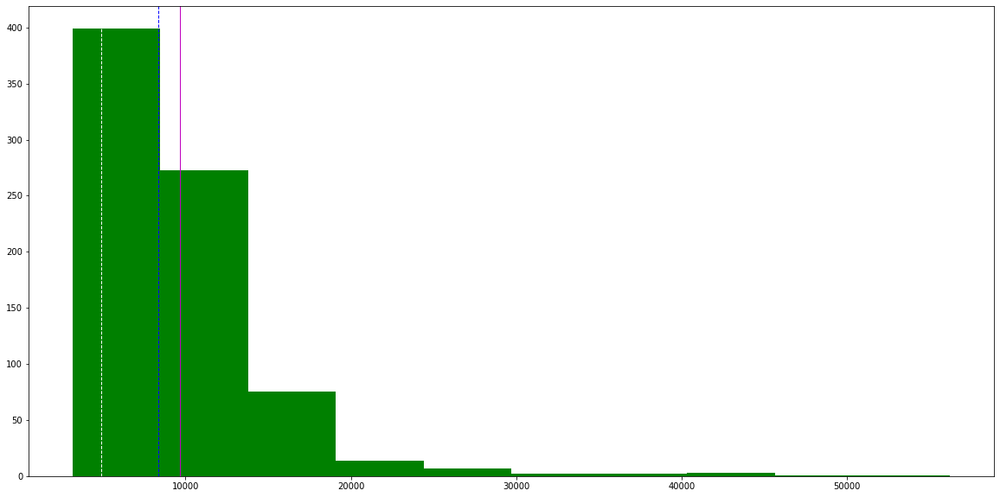

In [15]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Expend")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

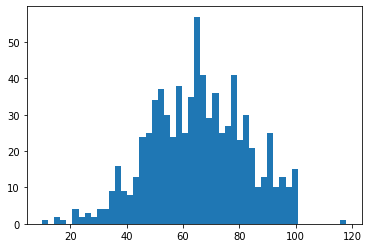

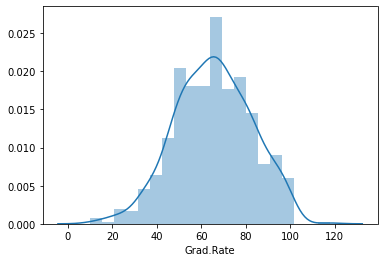

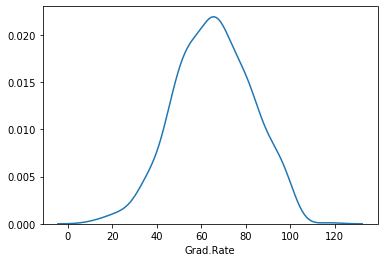

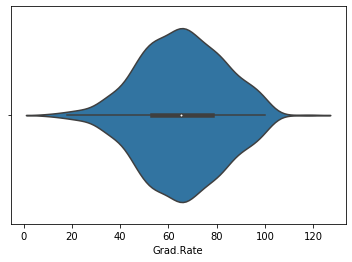

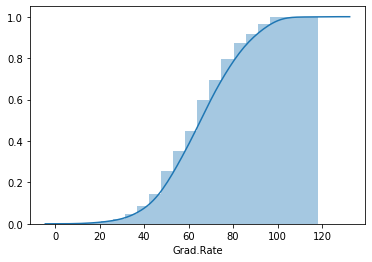

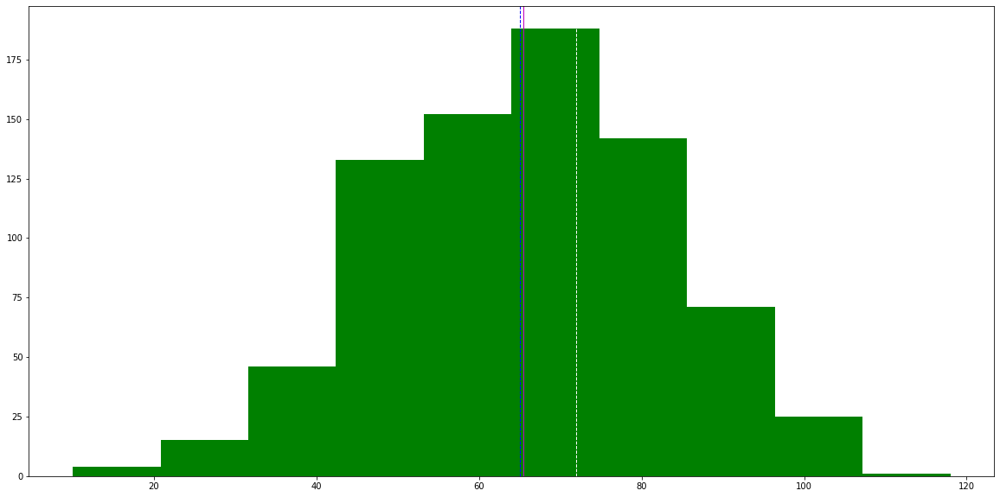

In [16]:
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv","Grad.Rate")
d.histdistplot(data)
d.histplotwithstat(data)

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

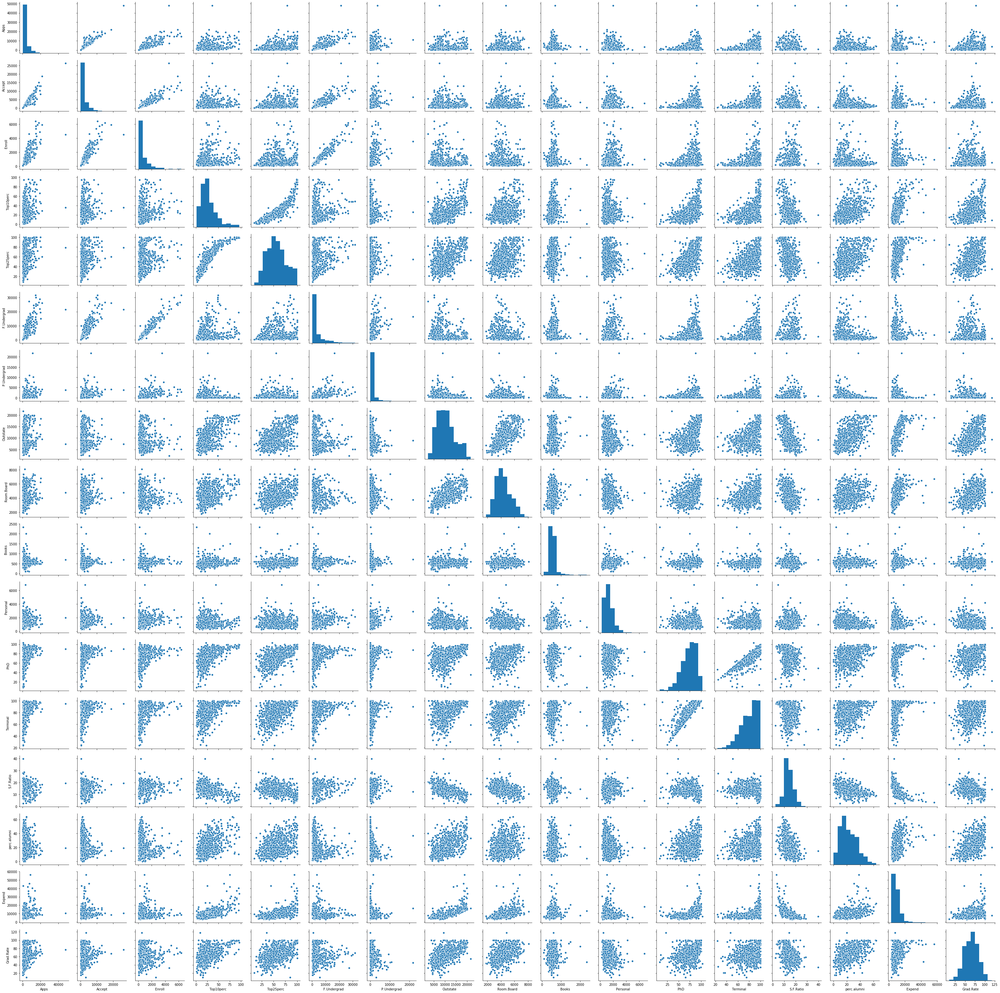

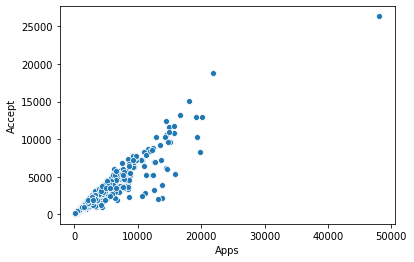

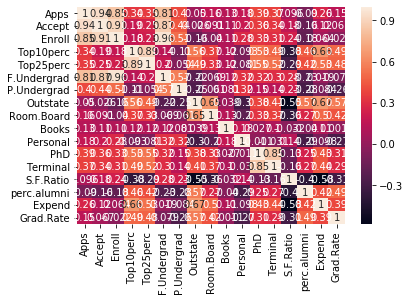

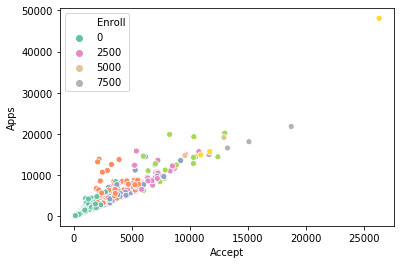

df dummies
                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Park_10  Park_15 

   Expend_0  Expend_1  Expend_2  Expend_3  Expend_4  Expend_5  Expend_6  \
0       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3       0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4       0.0       0.0       0.0       0.0       0.0       0.0       0.0   

   Expend_7  Expend_8  Expend_9  Expend_10  Expend_11  Expend_12  Expend_13  \
0       0.0       0.0       0.0        0.0        0.0        0.0        0.0   
1       0.0       0.0       0.0        0.0        0.0        0.0        0.0   
2       0.0       0.0       0.0        0.0        0.0        0.0        0.0   
3       0.0       0.0       0.0        0.0        0.0        0.0        0.0   
4       0.0       0.0       0.0        0.0        0.0        0.0        0.0   

   Expend_14  Expend_15  Expend_16  Expend_17  Expend_18  Expend_19  \
0  

                          Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Park_10  Park_15  Park_18  \


In [29]:
#Importing the libraries
#Encoding & Multi Variate Analysis
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
import warnings
from sklearn.preprocessing import OneHotEncoder
warnings.filterwarnings("ignore")
from PIL import Image
from sklearn.preprocessing import LabelEncoder

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        data=data.dropna()
    
        
    def statmet(self,data):
        print("corr\n",data.corr())
        print("skew\n",data.skew())
        print("kurt\n",data.kurt())
        
class Plot(FileRead):
    def plot(self,data,colname1,colname2,colname3):
        sns.pairplot(data)
        plt.show()
        sns.scatterplot(data[colname1], data[colname2])
        plt.show()
        sns.heatmap(data.corr(), annot=True)
        plt.show()
        sns.scatterplot(data[colname2], data[colname1], hue=data[colname3], palette='Set2')
        plt.show()
    
    def scatplot(self,data,colname1,colname2,colname3):
        sns.scatterplot(data[colname1], data[colname2])
        plt.show()
        sns.scatterplot(data[colname2], data[colname1], hue=data[colname3], palette='Set2')
        plt.show()
              
        
class Encode(Plot):
    def encode(self,data,colname):
        global df_dummies
        df_dummies= pd.get_dummies(data, prefix='Park', columns=[colname])
        print("df dummies\n",df_dummies.head())
        print("df colmns\n",df_dummies.columns)
    
    def labelencode(self,df_dummies,colname):
        labelencoder = LabelEncoder()  
        df_dummies[colname] = labelencoder.fit_transform(df_dummies[colname])
        print(df_dummies[colname].head(5))
        print(df_dummies[colname].value_counts())   # Number of entries of each class
        print(df_dummies[colname].unique())   # All the unique classes
        print(df_dummies[colname].nunique())  # number of unique classes
        
    def onehotencode(self,df_dummies,colname):
        hotencoder = OneHotEncoder()
        encoded = hotencoder.fit_transform(df_dummies[colname].values.reshape(-1,1)).toarray() 
        # Returns a numpy array of one hot encoded variables
        print(encoded)
        print(encoded.shape)
        # convert the array into a dataframe. Specifically, one hot encoded dataframe
        df_encoded = pd.DataFrame(encoded, columns = [colname+"_"+str(int(i)) for i in range(encoded.shape[1])])
        print(df_encoded.head())
        print(df_encoded.shape)
        df_dummies = pd.concat([df_dummies, df_encoded], axis=1)  # concats two dataframes
        print(df_dummies.head(5)) 

d=Encode()
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv")
d.statmet(data)
d.plot(data,'Apps','Accept','Enroll')
d.encode(data,'Grad.Rate')
d.labelencode(df_dummies,'Expend')
d.onehotencode(df_dummies,'Expend')

In [30]:
data.corr()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.000000,0.943451,0.846822,0.338834,0.351640,0.814491,0.398264,0.050159,0.164939,0.132559,0.178731,0.390697,0.369491,0.095633,-0.090226,0.259592,0.146755
Accept,0.943451,1.000000,0.911637,0.192447,0.247476,0.874223,0.441271,-0.025755,0.090899,0.113525,0.200989,0.355758,0.337583,0.176229,-0.159990,0.124717,0.067313
Enroll,0.846822,0.911637,1.000000,0.181294,0.226745,0.964640,0.513069,-0.155477,-0.040232,0.112711,0.280929,0.331469,0.308274,0.237271,-0.180794,0.064169,-0.022341
Top10perc,0.338834,0.192447,0.181294,1.000000,0.891995,0.141289,-0.105356,0.562331,0.371480,0.118858,-0.093316,0.531828,0.491135,-0.384875,0.455485,0.660913,0.494989
Top25perc,0.351640,0.247476,0.226745,0.891995,1.000000,0.199445,-0.053577,0.489394,0.331490,0.115527,-0.080810,0.545862,0.524749,-0.294629,0.417864,0.527447,0.477281
F.Undergrad,0.814491,0.874223,0.964640,0.141289,0.199445,1.000000,0.570512,-0.215742,-0.068890,0.115550,0.317200,0.318337,0.300019,0.279703,-0.229462,0.018652,-0.078773
P.Undergrad,0.398264,0.441271,0.513069,-0.105356,-0.053577,0.570512,1.000000,-0.253512,-0.061326,0.081200,0.319882,0.149114,0.141904,0.232531,-0.280792,-0.083568,-0.257001
Outstate,0.050159,-0.025755,-0.155477,0.562331,0.489394,-0.215742,-0.253512,1.000000,0.654256,0.038855,-0.299087,0.382982,0.407983,-0.554821,0.566262,0.672779,0.571290
Room.Board,0.164939,0.090899,-0.040232,0.371480,0.331490,-0.068890,-0.061326,0.654256,1.000000,0.127963,-0.199428,0.329202,0.374540,-0.362628,0.272363,0.501739,0.424942
Books,0.132559,0.113525,0.112711,0.118858,0.115527,0.115550,0.081200,0.038855,0.127963,1.000000,0.179295,0.026906,0.099955,-0.031929,-0.040208,0.112409,0.001061


Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

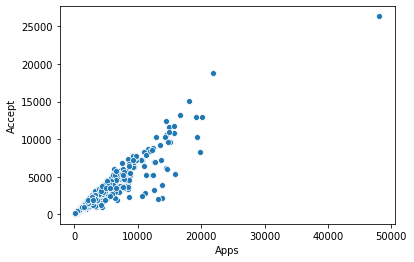

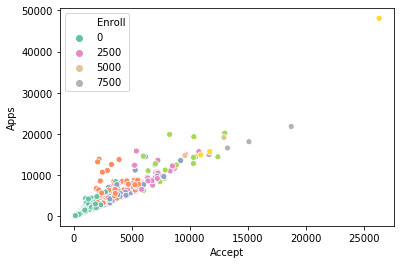

In [21]:
d=Encode()
d.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv")
d.scatplot(data,'Apps','Accept','Enroll')

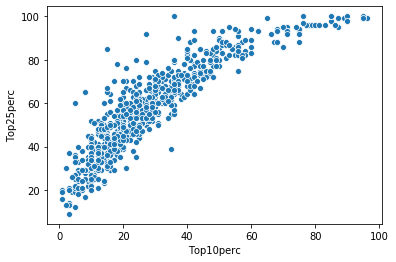

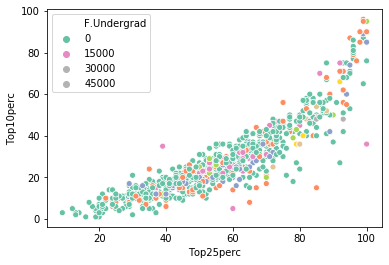

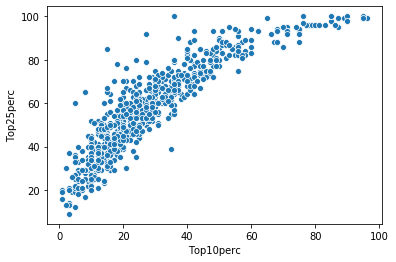

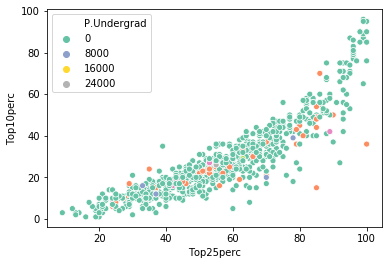

In [22]:
d.scatplot(data,'Top10perc','Top25perc','F.Undergrad')
d.scatplot(data,'Top10perc','Top25perc','P.Undergrad')

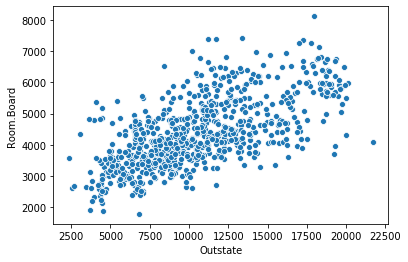

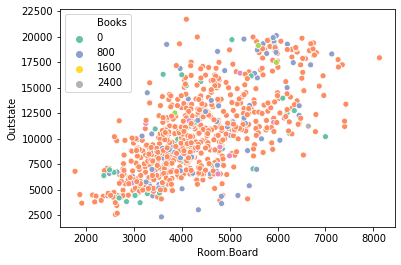

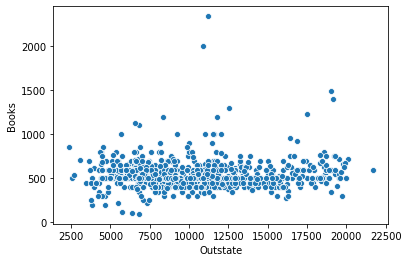

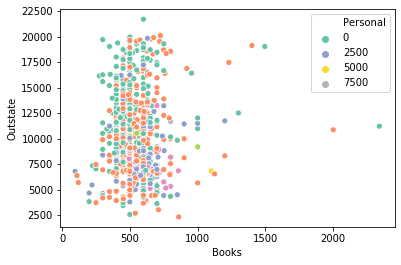

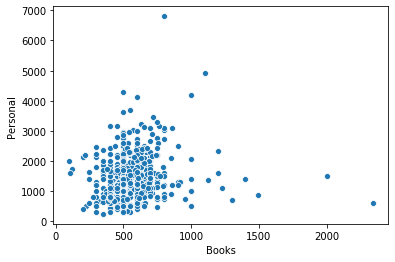

...

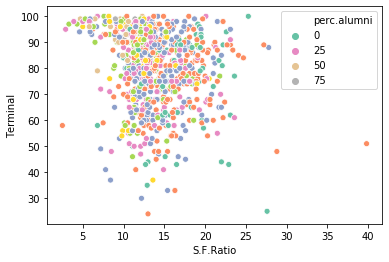

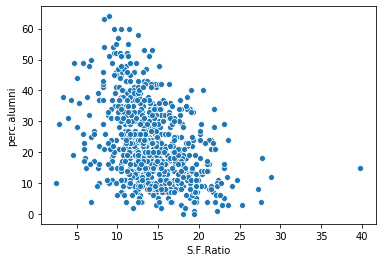

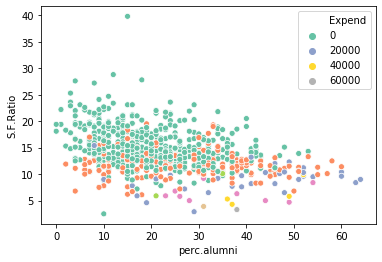

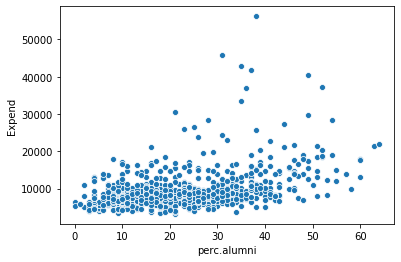

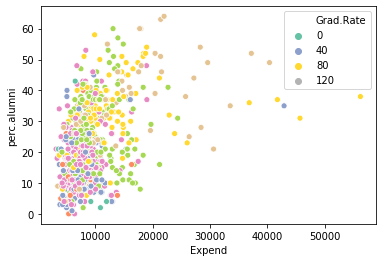

In [24]:
d.scatplot(data,'Outstate','Room.Board','Books')
d.scatplot(data,'Outstate','Books','Personal')
d.scatplot(data,'Books','Personal','PhD')
d.scatplot(data,'Personal','PhD','Terminal')
d.scatplot(data,'PhD','Terminal','S.F.Ratio')
d.scatplot(data,'Terminal','S.F.Ratio','perc.alumni')
d.scatplot(data,'S.F.Ratio','perc.alumni','Expend')
d.scatplot(data,'perc.alumni','Expend','Grad.Rate')

In [25]:
#Importing the libraries
#Normalization and Scaling
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
import warnings
from sklearn.preprocessing import OneHotEncoder
warnings.filterwarnings("ignore")
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        data=data.dropna()

class Scale(FileRead):
    def scale(self,data,colname,stdscalecolname,scalename):
        if(scalename=="Stdscale"):
            std_scale = StandardScaler()
        if(scalename=="MinMax"):
            std_scale = MinMaxScaler()
        print(std_scale)
        data[stdscalecolname] = std_scale.fit_transform(data[[colname]]) # returns z-scores of the values of the attribute
        print(data[stdscalecolname].tail())
        print(data[stdscalecolname].min(), data[stdscalecolname].max())  # min and max value
        print(data[stdscalecolname].describe())
    
    def logscale(self,data,colname,stdscalecolname):
        log_transformer = FunctionTransformer(np.log1p)
        print(log_transformer)
        print(data[colname].isnull().sum())
        data[colname]= data[colname].fillna(data[colname].mean())  # impute the null values using the mean
        data[stdscalecolname] = log_transformer.fit_transform(data[[colname]])   # Log Transform the attribute
        print(data[stdscalecolname].head())
        print(data[stdscalecolname].describe())
        
    def expscale(self,data,colname,stdscalecolname):
        log_transformer = FunctionTransformer(np.exp)
        print(log_transformer)
        data[stdscalecolname] = log_transformer.fit_transform(data[[colname]])   # Log Transform the attribute
        print(data[stdscalecolname].head())
        print(data[stdscalecolname].describe())
        
S=Scale()
S.readingfile("D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv")
S.scale(data,'PhD','PhD_Stdscale','Stdscale')
S.scale(data,'Terminal','Terminal_MinMaxScale','MinMax')
S.logscale(data,'S.F.Ratio','S.F.Ratio_logtransform')
S.expscale(data,'perc.alumni','perc.alumni_exptransform')

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

In [7]:
#Importing the libraries
#Normalization Scaling
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
import warnings
from sklearn.preprocessing import OneHotEncoder
warnings.filterwarnings("ignore")
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
#         print("Top 5 rows",data.head())
        data=data.dropna()

class Scale(FileRead):
    def scale(self,data,scalename):
        global colnames
        colnames=list(data.columns.values)
        for i in range(1,18):
            if(scalename=="Stdscale"):
                std_scale = StandardScaler()
            if(scalename=="MinMax"):
                std_scale = MinMaxScaler()
#             print(std_scale)
            data[colnames[i]+scalename+"Scaled"] = std_scale.fit_transform(data[[colnames[i]]]) # returns z-scores of the values of the attribute
#             print(data[colnames[i]+scalename+"Scaled"].tail())
            print("Min value of Scaled "+scalename+" "+colnames[i]+ " "+str(data[colnames[i]+scalename+"Scaled"].min())+"\n")  # min value
            print("Max value of Scaled "+scalename+" "+colnames[i]+ " "+str(data[colnames[i]+scalename+"Scaled"].max())+"\n")  # max value
            print("Metric of Scaled Column "+scalename+" "+colnames[i]+" "+"\n"+str(data[colnames[i]+scalename+"Scaled"].describe())+"\n")
    
    def logscale(self,data,scalename):
        for i in range(1,18):
            log_transformer = FunctionTransformer(np.log1p)
#             print(log_transformer)
#             print(data[colnames[i]].isnull().sum())
            data[colnames[i]]= data[colnames[i]].fillna(data[colnames[i]].mean())  # impute the null values using the mean
            data[colnames[i]+scalename+"Scaled"] = log_transformer.fit_transform(data[[colnames[i]]])   # Log Transform the attribute
#             print(data[colnames[i]+scalename+"Scaled"].head())
            print("Metric of Scaled Column "+scalename+" "+colnames[i]+" "+"\n"+str(data[colnames[i]+scalename+"Scaled"].describe())+"\n")
        
    def expscale(self,data,scalename):
        for i in range(1,18):
            log_transformer = FunctionTransformer(np.exp)
#             print(log_transformer)
            data[colnames[i]+scalename+"Scaled"] = log_transformer.fit_transform(data[[colnames[i]]])   # Log Transform the attribute
#             print(data[colnames[i]+scalename+"Scaled"].head())
            print("Metric of Scaled Column "+scalename+" "+colnames[i]+" "+"\n"+str(data[colnames[i]+scalename+"Scaled"].describe())+"\n")
        
S=Scale()
S.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv")
S.scale(data,'Stdscale')

Min value of Scaled Stdscale Apps -0.7551337089614527

Max value of Scaled Stdscale Apps 11.658671216805628

Metric of Scaled Column Stdscale Apps 
count    7.770000e+02
mean     6.355797e-17
std      1.000644e+00
min     -7.551337e-01
25%     -5.754408e-01
50%     -3.732540e-01
75%      1.609122e-01
max      1.165867e+01
Name: AppsStdscaleScaled, dtype: float64

Min value of Scaled Stdscale Accept -0.7947644945370548

Max value of Scaled Stdscale Accept 9.924815940416208

Metric of Scaled Column Stdscale Accept 
count    7.770000e+02
mean     6.774575e-17
std      1.000644e+00
min     -7.947645e-01
25%     -5.775805e-01
50%     -3.710108e-01
75%      1.654173e-01
max      9.924816e+00
Name: AcceptStdscaleScaled, dtype: float64

Min value of Scaled Stdscale Enroll -0.8022728463187818

Max value of Scaled Stdscale Enroll 6.043678173482203

Metric of Scaled Column Stdscale Enroll 
count    7.770000e+02
mean    -5.249269e-17
std      1.000644e+00
min     -8.022728e-01
25%     -5.793514e-0

In [50]:
S.scale(data,'MinMax')

Min value of Scaled MinMax Apps 0.0

Max value of Scaled MinMax Apps 1.0

Metric of Scaled Column MinMax Apps 
count    777.000000
mean       0.060830
std        0.080607
min        0.000000
25%        0.014475
50%        0.030763
75%        0.073793
max        1.000000
Name: AppsMinMaxScaled, dtype: float64

Min value of Scaled MinMax Accept 0.0

Max value of Scaled MinMax Accept 1.0

Metric of Scaled Column MinMax Accept 
count    777.000000
mean       0.074141
std        0.093347
min        0.000000
25%        0.020260
50%        0.039531
75%        0.089573
max        1.000000
Name: AcceptMinMaxScaled, dtype: float64

Min value of Scaled MinMax Enroll 0.0

Max value of Scaled MinMax Enroll 1.0

Metric of Scaled Column MinMax Enroll 
count    777.000000
mean       0.117189
std        0.146166
min        0.000000
25%        0.032563
50%        0.062765
75%        0.136385
max        1.000000
Name: EnrollMinMaxScaled, dtype: float64

Min value of Scaled MinMax Top10perc 0.0

Max value

In [53]:
S.logscale(data,'logtransform')

Metric of Scaled Column logtransform Apps 
count    777.000000
mean       7.427593
std        1.072769
min        4.406719
25%        6.655440
50%        7.351800
75%        8.195610
max       10.780934
Name: AppslogtransformScaled, dtype: float64

Metric of Scaled Column logtransform Accept 
count    777.000000
mean       7.110960
std        0.988941
min        4.290459
25%        6.405228
50%        7.013016
75%        7.793587
max       10.178502
Name: AcceptlogtransformScaled, dtype: float64

Metric of Scaled Column logtransform Enroll 
count    777.000000
mean       6.176126
std        0.951072
min        3.583519
25%        5.493061
50%        6.075346
75%        6.805723
max        8.762959
Name: EnrolllogtransformScaled, dtype: float64

Metric of Scaled Column logtransform Top10perc 
count    777.000000
mean       3.169247
std        0.627759
min        0.693147
25%        2.772589
50%        3.178054
75%        3.583519
max        4.574711
Name: Top10perclogtransformScaled, dt

In [55]:
S.expscale(data,'exptransform')

Metric of Scaled Column exptransform Apps 
count    7.770000e+02
mean              inf
std               NaN
min      1.506097e+35
25%               NaN
50%               NaN
75%               NaN
max               inf
Name: AppsexptransformScaled, dtype: float64

Metric of Scaled Column exptransform Accept 
count     7.770000e+02
mean               inf
std                NaN
min       1.858672e+31
25%      2.059999e+262
50%                NaN
75%                NaN
max                inf
Name: AcceptexptransformScaled, dtype: float64

Metric of Scaled Column exptransform Enroll 
count     7.770000e+02
mean               inf
std                NaN
min       1.586013e+15
25%      1.256796e+105
50%      3.046528e+188
75%                NaN
max                inf
Name: EnrollexptransformScaled, dtype: float64

Metric of Scaled Column exptransform Top10perc 
count    7.770000e+02
mean     1.338478e+39
std      2.091449e+40
min      2.718282e+00
25%      3.269017e+06
50%      9.744803e+09
7

In [11]:
S=Scale()
S.readingfile("D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard_nooutliers.csv")
S.scale(data,'Stdscale')

Min value of Scaled Stdscale Apps -1.02880091945421

Max value of Scaled Stdscale Apps 2.1996893199253593

Metric of Scaled Column Stdscale Apps 
count    7.770000e+02
mean     1.234534e-16
std      1.000644e+00
min     -1.028801e+00
25%     -7.416863e-01
50%     -4.186307e-01
75%      4.348639e-01
max      2.199689e+00
Name: AppsStdscaleScaled, dtype: float64

Min value of Scaled Stdscale Accept -1.0998317537272408

Max value of Scaled Stdscale Accept 2.2385244841753664

Metric of Scaled Column Stdscale Accept 
count    7.770000e+02
mean     1.340626e-16
std      1.000644e+00
min     -1.099832e+00
25%     -7.503620e-01
50%     -4.179715e-01
75%      4.451926e-01
max      2.238524e+00
Name: AcceptStdscaleScaled, dtype: float64

Min value of Scaled Stdscale Enroll -1.0976355818328598

Max value of Scaled Stdscale Enroll 2.161632388531481

Metric of Scaled Column Stdscale Enroll 
count    7.770000e+02
mean     1.521645e-16
std      1.000644e+00
min     -1.097636e+00
25%     -7.343246e-01

In [15]:
#Importing the libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        
class PreProcess(FileRead):
    def duplicates(self,data):
        ##Identify duplicates records in the data
            dupes = data.duplicated()
            print(sum(dupes))
            ##here we can see that there are 13 duplicated rows. We want to remove the duplicate rows.
            #Removing Duplicates
            data =data.drop_duplicates()
            #Now check the duplicate data again and you will see that there are no duplicate rows.
            dupes = data.duplicated()
            print(sum(dupes))
            
    def preprocess(self,data,colname):
        print(pd.DataFrame({'value' : data[colname], 'Missing?' : data[colname].isnull()}))
    def missval(self,data,setcolname):
        print(pd.DataFrame(data.isnull().sum(), columns= [setcolname]))
        print(data.isnull().values.any())
        print(data.isnull().sum().sum())
    def replacemissval(self,data,colname):
                # Replacing NaN with a custom value
        data[colname].fillna(12345, inplace = True)   
        # Replace NaN values with the mean of the column
        # data['Number'].fillna(data.Number.mean(), inplace = True)  
        # Replace NaN values with the median of the column
        # data['Number'].fillna(data.Number.median(), inplace = True)  
        print(data)
        #location based
        data.loc[2,colname] = 1234  # replace a value at a specific location
        print(data)
        data.dropna(inplace=True)  # Drops all the rows that have atleast one missing values
        print(data.isnull().sum())
        print(data)
        print(data.tail())
        
P=PreProcess()
P.readingfile("D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv")
P.duplicates(data)
P.preprocess(data,'Apps')
P.preprocess(data,'Accept')
P.preprocess(data,'Enroll')
P.missval(data,'Number of missing values')
P.replacemissval(data,'Outstate')

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

                          Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0        78      

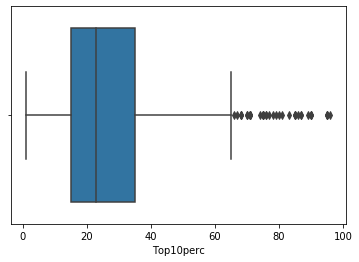

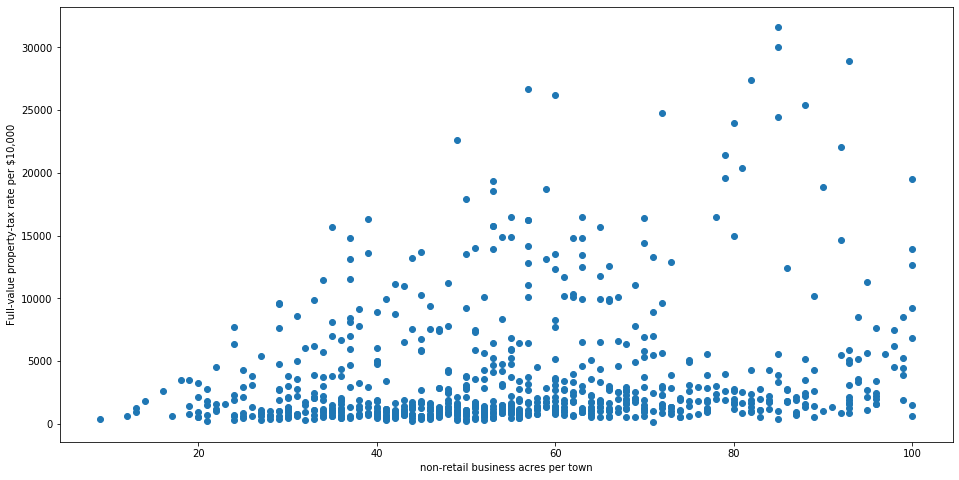

Apps           2848.0
Accept         1820.0
Enroll          660.0
Top10perc        20.0
Top25perc        28.0
F.Undergrad    3013.0
P.Undergrad     872.0
Outstate       5605.0
Room.Board     1453.0
Books           130.0
Personal        850.0
PhD              23.0
Terminal         21.0
S.F.Ratio         5.0
perc.alumni      18.0
Expend         4079.0
Grad.Rate        25.0
dtype: float64
(array([  1,   3,   4,   4,  16,  16,  16,  18,  20,  21,  21,  21,  23,
        23,  23,  23,  23,  27,  27,  27,  34,  37,  38,  39,  39,  39,
        47,  54,  59,  59,  59,  59,  59,  60,  60,  60,  61,  61,  61,
        61,  63,  64,  69,  69,  69,  69,  70,  70,  70,  71,  71,  72,
        78,  79,  85,  86,  86,  86,  87,  87,  87,  91,  91,  91,  95,
        95, 100, 100, 102, 106, 114, 114, 118, 118, 118, 118, 118, 133,
       137, 138, 141, 141, 141, 141, 142, 144, 144, 152, 158, 158, 158,
       159, 159, 170, 174, 174, 174, 176, 176, 176, 176, 177, 181, 181,
       189, 191, 191, 191, 201, 20

In [19]:
from sklearn.datasets import load_boston
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

class FileLoad:
    def fileload(self):
        global boston_df
        boston_df = pd.read_csv('D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv')
        print(boston_df.head())

class Plot(FileLoad):
    
    def Plot(self,boston_df,colname,colname1,colname2):
        sns.boxplot(x=boston_df[colname])
        plt.show()
        fig, ax = plt.subplots(figsize=(16,8))   # setting the figure size of the plot
        ax.scatter(boston_df[colname1], boston_df[colname2])  # scatter plot
        ax.set_xlabel('non-retail business acres per town')
        ax.set_ylabel('Full-value property-tax rate per $10,000')
        plt.show()
        
    def Zscore(self,boston_df):
        global threshold
        global z
        z = np.abs(stats.zscore(boston_df))   # get the z-score of every value with respect to their columns
        print(z)
        threshold = 3
        print(np.where(z > threshold))
        print(z[55][1])
        
    def IQR(self,boston_df):
        global Q1,Q3,IQR
        Q1 = boston_df.quantile(0.25)
        Q3 = boston_df.quantile(0.75)
        IQR = Q3 - Q1
        print(IQR)
        print(np.where((boston_df < (Q1 - 1.5 * IQR)) | (boston_df > (Q3 + 1.5 * IQR))))
        
    def DataReplace(self,boston_df,threshold,z):
        boston_df1 = boston_df[(z < 3).all(axis=1)]    # Select only the rows without a single outlier
        print(boston_df1.shape, boston_df.shape)
        boston_df2 = boston_df.copy()   #make a deep copy of the dataframe

        #Replace all the outliers with median values. This will create new some outliers but, we will ignore them
        
        for i, j in zip(np.where(z > threshold)[0], np.where(z > threshold)[1]):# iterate using 2 variables.i for rows and j for columns
            boston_df2.iloc[i,j] = boston_df.iloc[:,j].median()  # replace i,jth element with the median of j i.e, corresponding column
        z = np.abs(stats.zscore(boston_df2))
        print(np.where(z > threshold))
        print(threshold)
        print(np.where(z > threshold)[0])
        
    def nonoutlierreplace(self,boston_df,Q1,Q3,IQR):
        boston_df_out = boston_df[~((boston_df < (Q1 - 1.5 * IQR)) |(boston_df > (Q3 + 1.5 * IQR))).any(axis=1)] # rows without outliers
        print(boston_df_out.shape)
        boston_df4 = boston_df.copy()
        # Replace every outlier on the lower side by the lower whisker
        for i, j in zip(np.where(boston_df4 < Q1 - 1.5 * IQR)[0], np.where(boston_df4 < Q1 - 1.5 * IQR)[1]): 
            whisker  = Q1 - 1.5 * IQR
            boston_df4.iloc[i,j] = whisker[j]
        #Replace every outlier on the upper side by the upper whisker    
        for i, j in zip(np.where(boston_df4 > Q3 + 1.5 * IQR)[0], np.where(boston_df4 > Q3 + 1.5 * IQR)[1]):
            whisker  = Q3 + 1.5 * IQR
            boston_df4.iloc[i,j] = whisker[j]
        print(boston_df4.shape, boston_df.shape)
        
P1=Plot()
P1.fileload()
P1.Plot(boston_df,'Top10perc','Top25perc','F.Undergrad')
# P1.Zscore(boston_df)
P1.IQR(boston_df)
# P1.DataReplace(boston_df,threshold,z)
# P1.nonoutlierreplace(boston_df,Q1,Q3,IQR)

                          Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0        78      

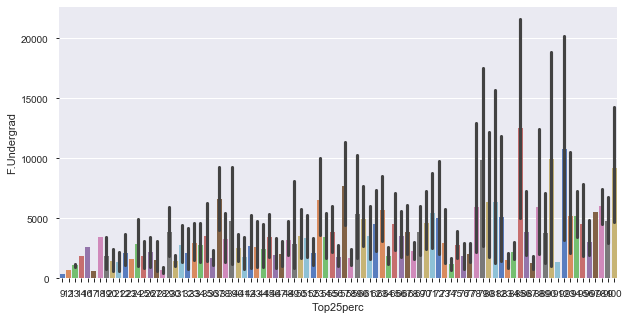

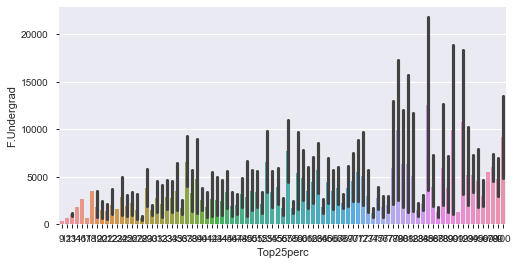

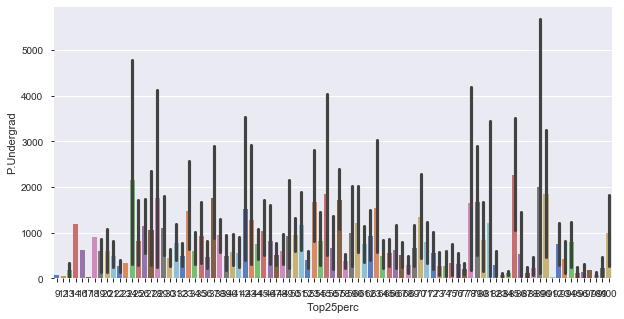

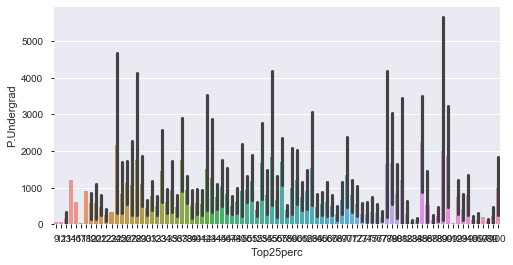

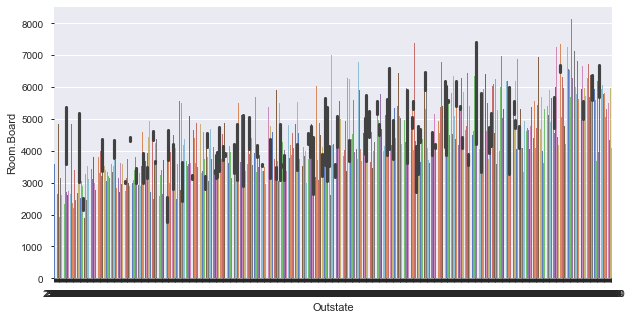

...

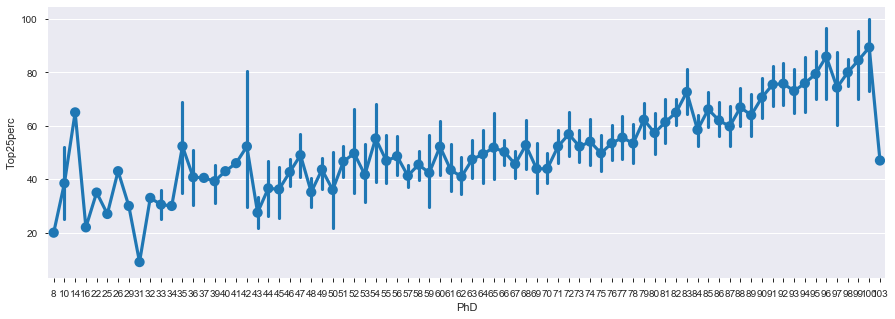

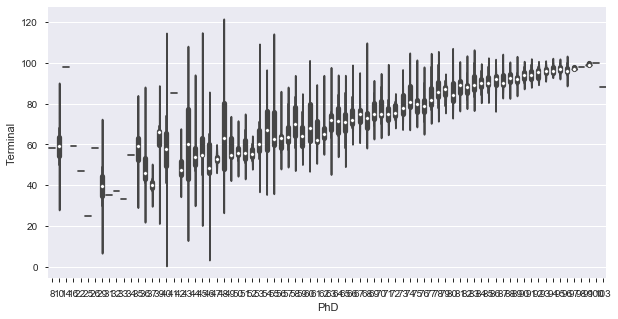

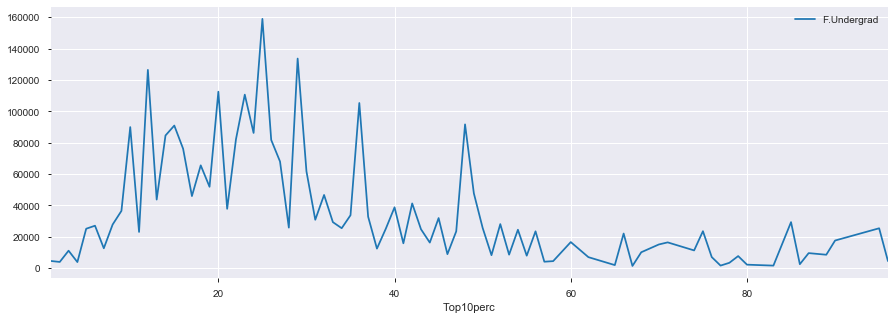

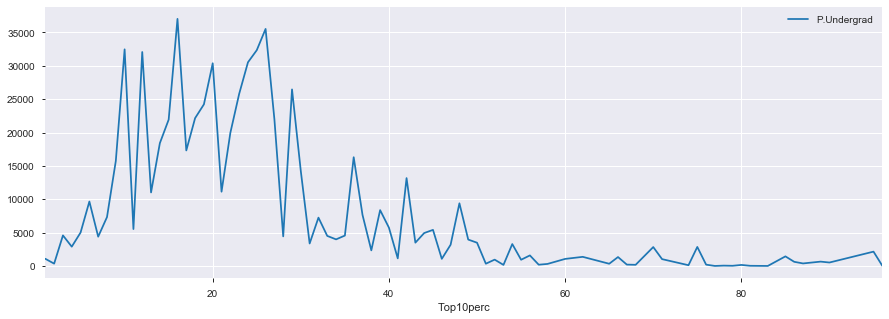

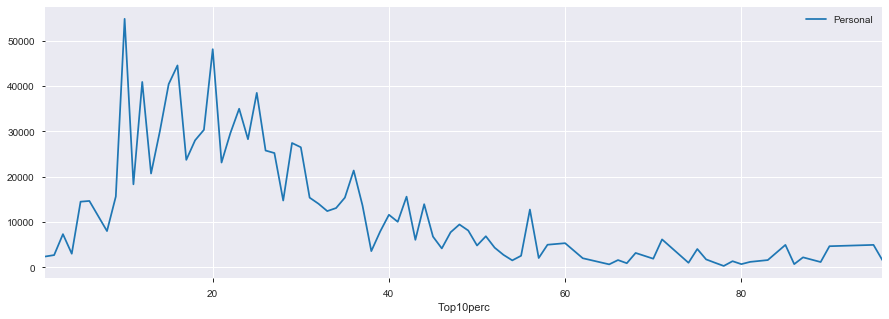

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
class FileRead:
    def Fileload(self,filepath):
        global data
        data=pd.read_csv(filepath)
        print(data.head())
    def statmetric(self,data):
        print(data.describe())
        print(data.columns)
        print(data.shape)
        print(data.dtypes.value_counts())
        print(data.info())
    def missing_check(self,df):
        total = df.isnull().sum().sort_values(ascending=False)   # total number of null values
        percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)  # percentage of values that are null
        missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])  # putting the above two together
        print(missing_data) # return the dataframe
    def partmet(self,data):
        print(data.iloc[:,[4,5,6]].describe())
    def crosstab(self,data,colname):
        my_tab = pd.crosstab(index=data[colname],columns="count")   # Make a crosstab
        print(my_tab)
        
    def plot(self,data,colname1,colname2,kind):
            data.groupby(by=[colname1])[colname2].sum().reset_index().sort_values([colname2]).tail(10).plot(x=colname1,
                                                                                                           y=colname2,
                                                                                                           kind=kind,
                                                                                                           figsize=(15,5))
            plt.show()
            data.groupby(by=[colname1])[colname2].sum().reset_index().sort_values([colname2],ascending=True).head(10).plot(x=colname1,
                                                                                                           y=colname2,
                                                                                                           kind=kind,
                                                                                                           figsize=(15,5))
            plt.show()
            
    def barplot(self,data,x,y):
        plt.figure(figsize=(10,5))  # setting the figure size
        ax = sns.barplot(x=x, y=y, data=data, palette='muted')  # barplot
        plt.show()
        
        plt.figure(figsize=(8,4))
        ax = sns.barplot(x=x, y=y, data=data)
        plt.show()
        
    def otherplots(self,data,x,y,x1,y1):
        figure = plt.figure(figsize=(15,5))
        ax = sns.scatterplot(x=x,y=y, data=data, size = y) # scatter plot
        plt.show()
        
        figure = plt.figure(figsize=(50,15))
        ax = sns.regplot(x=x,y=y, data=data ) # regression plot - scatter plot with a regression line
        plt.show()
        
        ax = sns.regplot(x=x,y=y, data=data.head()) # regression plot - scatter plot with a regression line
        plt.show()
        
        figure = plt.figure(figsize=(15,7))
        sns.scatterplot(x=x1, y=y1, data=data) # scatter plot 
        plt.show()
        
        plt.figure(figsize=(10,5))
        sns.heatmap(data.corr(), annot=True, linewidths=.5, fmt= '.1f', center = 1 )  # heatmap
        plt.show()
        
    def barplots(self,data,x,y,hue1,hue2):
        plt.figure(figsize=(15,5))
        sns.barplot(data=data,x=x,y=y,hue=hue1)
        plt.show()

        plt.figure(figsize=(15,5))
        sns.barplot(data=data,x=x,y=y,hue=hue2)
        plt.show()
        
    def revbar(self,data,colname,grpbycolname1,grpbycolname2,ptx,vioy):
        suic_sum_m = data[colname].groupby([data[grpbycolname1],data[grpbycolname2]]).sum()  # number of suicides by country and sex
        suic_sum_m = suic_sum_m.reset_index().sort_index(by=colname,ascending=False) # sort in descending order
        most_cont_m = suic_sum_m.head(10)  # getting the top ten countries in terms of suicides
        fig = plt.figure(figsize=(15,5))
        plt.title('Count of suicides for 31 years.')
        sns.barplot(y=grpbycolname1,x=colname,hue=grpbycolname2,data=most_cont_m,palette='Set2');
        plt.ylabel('Count of suicides')
        plt.tight_layout()
        plt.show()
        
        plt.figure(figsize=(15,5))
        sns.pointplot(x=ptx, y=colname,data=data)
        plt.show()
        
        plt.figure(figsize=(10,5))
        sns.violinplot(x=data[ptx], y=data[vioy])
        plt.show()
        
    def trendplot(self,data,col1,col2,grpbycol):
        data[[col1,col2]].groupby([grpbycol]).sum().plot(figsize=(15,5))
        plt.show()
        
SR=FileRead()
SR.Fileload('D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv')
SR.statmetric(data)
SR.missing_check(data)
SR.partmet(data)
SR.crosstab(data,'Apps')
# SR.plot(data,'Accept','Enroll','Top10perc')
SR.barplot(data,'Top25perc','F.Undergrad')
SR.barplot(data,'Top25perc','P.Undergrad')
SR.barplot(data,'Outstate','Room.Board')
SR.otherplots(data,'Books','Personal','PhD','Terminal')
# SR.barplots(data,'Accept','Enroll','Apps','Top10perc')
SR.revbar(data,'Top25perc','Outstate','Room.Board','PhD','Terminal')
SR.trendplot(data,'Top10perc','F.Undergrad','Top10perc')
SR.trendplot(data,'Top10perc','P.Undergrad','Top10perc')
SR.trendplot(data,'Top10perc','Personal','Top10perc')

In [22]:
import pandas_profiling
class PandProfile:
    def PandProfile(self):
        df = pd.read_csv('D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv')
        profile = df.profile_report(title='Slump+Test')
        profile.to_file(output_file="D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.html")
A=PandProfile()
A.PandProfile()

Top 5 rows                           Names  Apps  Accept  Enroll  Top10perc  Top25perc  \
0  Abilene Christian University  1660    1232     721         23         52   
1            Adelphi University  2186    1924     512         16         29   
2                Adrian College  1428    1097     336         22         50   
3           Agnes Scott College   417     349     137         60         89   
4     Alaska Pacific University   193     146      55         16         44   

   F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  PhD  \
0         2885          537      7440        3300    450      2200   70   
1         2683         1227     12280        6450    750      1500   29   
2         1036           99     11250        3750    400      1165   53   
3          510           63     12960        5450    450       875   92   
4          249          869      7560        4120    800      1500   76   

   Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
0     

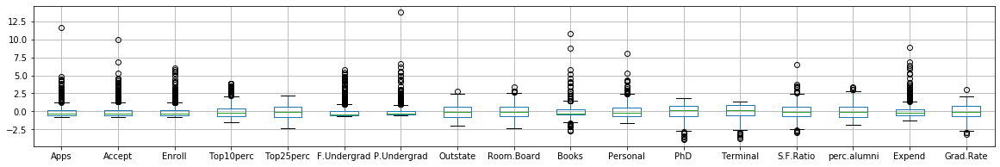

Covariance Matrix 
%s [[ 1.00128866  0.94466636  0.84791332  0.33927032  0.35209304  0.81554018
   0.3987775   0.05022367  0.16515151  0.13272942  0.17896117  0.39120081
   0.36996762  0.09575627 -0.09034216  0.2599265   0.14694372]
 [ 0.94466636  1.00128866  0.91281145  0.19269493  0.24779465  0.87534985
   0.44183938 -0.02578774  0.09101577  0.11367165  0.20124767  0.35621633
   0.3380184   0.17645611 -0.16019604  0.12487773  0.06739929]
 [ 0.84791332  0.91281145  1.00128866  0.18152715  0.2270373   0.96588274
   0.51372977 -0.1556777  -0.04028353  0.11285614  0.28129148  0.33189629
   0.30867133  0.23757707 -0.18102711  0.06425192 -0.02236983]
 [ 0.33927032  0.19269493  0.18152715  1.00128866  0.89314445  0.1414708
  -0.10549205  0.5630552   0.37195909  0.1190116  -0.09343665  0.53251337
   0.49176793 -0.38537048  0.45607223  0.6617651   0.49562711]
 [ 0.35209304  0.24779465  0.2270373   0.89314445  1.00128866  0.19970167
  -0.05364569  0.49002449  0.33191707  0.115676   -0.08091441

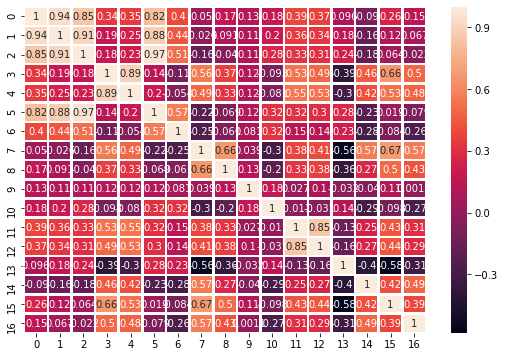

Eigen Vectors 
%s [[-2.48765602e-01  3.31598227e-01  6.30921033e-02 -2.81310530e-01
   5.74140964e-03  1.62374420e-02  4.24863486e-02  1.03090398e-01
   9.02270802e-02 -5.25098025e-02  3.58970400e-01 -4.59139498e-01
   4.30462074e-02 -1.33405806e-01  8.06328039e-02 -5.95830975e-01
   2.40709086e-02]
 [-2.07601502e-01  3.72116750e-01  1.01249056e-01 -2.67817346e-01
   5.57860920e-02 -7.53468452e-03  1.29497196e-02  5.62709623e-02
   1.77864814e-01 -4.11400844e-02 -5.43427250e-01  5.18568789e-01
  -5.84055850e-02  1.45497511e-01  3.34674281e-02 -2.92642398e-01
  -1.45102446e-01]
 [-1.76303592e-01  4.03724252e-01  8.29855709e-02 -1.61826771e-01
  -5.56936353e-02  4.25579803e-02  2.76928937e-02 -5.86623552e-02
   1.28560713e-01 -3.44879147e-02  6.09651110e-01  4.04318439e-01
  -6.93988831e-02 -2.95896092e-02 -8.56967180e-02  4.44638207e-01
   1.11431545e-02]
 [-3.54273947e-01 -8.24118211e-02 -3.50555339e-02  5.15472524e-02
  -3.95434345e-01  5.26927980e-02  1.61332069e-01  1.22678028e-01
 

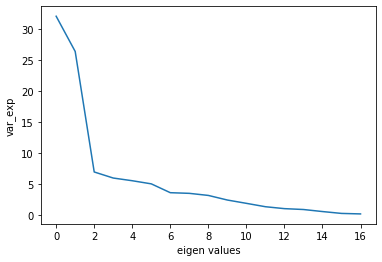

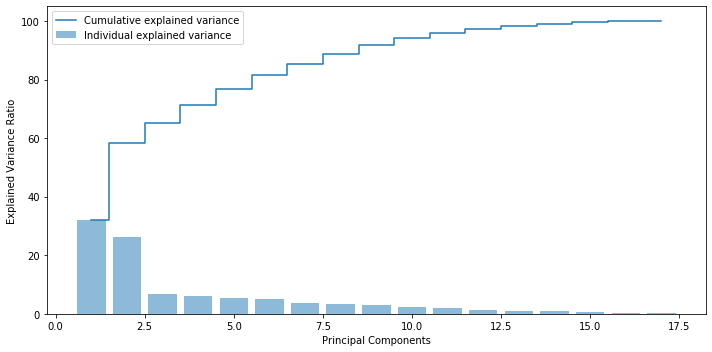

PCA Components when no of components =11
[[ 0.2487656   0.2076015   0.17630359  0.35427395  0.34400128  0.15464096
   0.0264425   0.29473642  0.24903045  0.06475752 -0.04252854  0.31831287
   0.31705602 -0.17695789  0.20508237  0.31890875  0.25231565]
 [ 0.33159823  0.37211675  0.40372425 -0.08241182 -0.04477866  0.41767377
   0.31508783 -0.24964352 -0.13780888  0.05634184  0.21992922  0.05831132
   0.04642945  0.24666528 -0.24659527 -0.13168986 -0.16924053]
 [-0.0630921  -0.10124906 -0.08298557  0.03505553 -0.02414794 -0.06139298
   0.13968172  0.04659887  0.14896739  0.67741165  0.49972112 -0.12702837
  -0.06603755 -0.2898484  -0.14698927  0.22674398 -0.20806465]
 [ 0.28131053  0.26781735  0.16182677 -0.05154725 -0.10976654  0.10041234
  -0.15855849  0.13129136  0.18499599  0.08708922 -0.23071057 -0.53472483
  -0.51944302 -0.16118949  0.01731422  0.07927349  0.26912907]
 [ 0.00574141  0.05578609 -0.05569364 -0.39543434 -0.42653359 -0.04345437
   0.30238541  0.222532    0.56091947 -0.

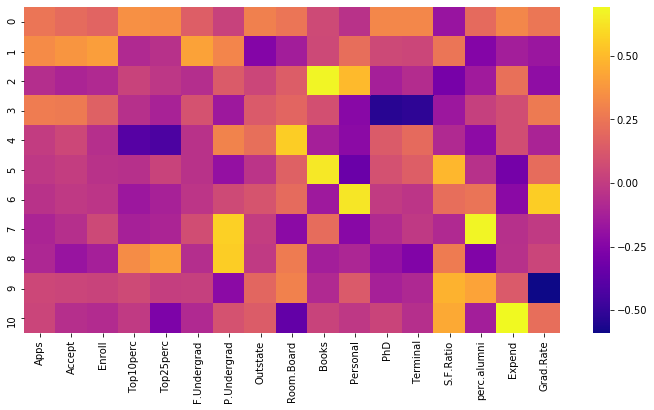

In [ ]:
#Importing the libraries
#PCA
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
from scipy.stats import zscore
from sklearn.decomposition import PCA

class FileRead:
    def readingfile(self,filepath):
        global data
        data = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        
class StatMet(FileRead):
    def StatMetric(self,data,colname):
        print("shaple\n",data.shape)
        print("dtype\n",data.dtypes)
        print("describe\n",data.describe().T)
        print("colnunique\n",data[colname].unique())
        print("isnasum\n",data.isna().sum())
        print("Quesmark\n",data[data[colname]=="?"])
        print("quesmarkcount\n",data[data[colname]=="?"].count())
        print("quesmarkvaluecounts\n",data[colname].value_counts())
    def duphandle(self,data,colname,vartype):
        data[colname].replace("?",'1', inplace=True)
        print(data[colname].value_counts())
        data[colname] = data[colname].astype(vartype)
        dups = data.duplicated()
        print('Number of duplicate rows = %d' % (dups.sum()))
        print(data[dups])
        print('Number of rows before discarding duplicates = %d' % (data.shape[0]))
        data.drop_duplicates(subset = None, keep = 'first', inplace=True)
        print('Number of rows after discarding duplicates = %d' % (data.shape[0]))
        print(data.corr(method='pearson'))  
        
    def plot(self,data):
#         sns.pairplot(data,diag_kind='kde')
#         plt.show()
        data.boxplot(figsize=(20,3))
        plt.show()
        f, ax = plt.subplots(figsize=(9, 6))
        corre=data.corr()
        print('Correlation Matrix \n%s', data.corr())
        print("Correlation HeatMap\n")
        sns.heatmap(corre, annot=True, linewidths=1.5, ax=ax)
        plt.show()
    
    def crosstabdrp(self,data,colname1,colname2,limit):
        print(pd.crosstab(data[colname1], data[colname2]))
        data[colname1] = np.where(data[colname1] >limit, limit, data[colname1])
        print(data[colname1].value_counts())
    
    def datadrop(self,data,colname1):
        global data_new
        data_new = data.drop([colname1], axis =1)
        print(data_new.head())
    
    def outliercount(self,indata):
        Q1 = indata.quantile(0.25)
        Q3 = indata.quantile(0.75)
        IQR = Q3 - Q1
        OutlierCount=((indata < (Q1 - 1.5 * IQR)) | (indata > (Q3 + 1.5 * IQR))).sum()
        print(OutlierCount.sort_values())
        print("Total outlier sum\n",OutlierCount.sum())
    
class Normalpca(StatMet):
    def Zscoreplot(self,data_new):
        global data_new1
        data_new1=data_new.apply(zscore)
        print('zscore\n',data_new1.head())
        data_new1.boxplot(figsize=(20,3))
        plt.show()
    
    def covmateigen(self,data_new1):
        global cov_matrix
        global eig_vals
        global eig_vecs
        cov_matrix = np.cov(data_new1.T)
        f, ax = plt.subplots(figsize=(9, 6))
        print('Covariance Matrix \n%s', cov_matrix)
        print("Covariance HeatMap\n")
        sns.heatmap(cov_matrix, annot=True, linewidths=1.5, ax=ax)
        plt.show()
        eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
        print('Eigen Vectors \n%s', eig_vecs)
        print('\nFirst Eigen vector\n%s',eig_vecs[0])
        print('\n Eigen Values \n%s', eig_vals)
        print('\nFirst Eigen Value\n%s',eig_vals[0])
    
    def totsumplot(self,eig_vals):
        global tot
        global var_exp
        global cum_var_exp
        tot = sum(eig_vals)
        var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
        print("var_exp\n",var_exp)
        cum_var_exp = np.cumsum(var_exp)
        print("Cumulative Variance Explained", cum_var_exp)
        plt.plot(var_exp)
        plt.ylabel('var_exp')
        plt.xlabel('eigen values')
        plt.show()
    def eigvalplot(self,eig_vals,var_exp,cum_var_exp):
    # Ploting 
        plt.figure(figsize=(10 , 5))
        plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
        plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
        plt.ylabel('Explained Variance Ratio')
        plt.xlabel('Principal Components')
        plt.legend(loc = 'best')
        plt.tight_layout()
        plt.show()
    def boxplot(self,data):
        data.boxplot(figsize=(20,3))
        plt.show()
    def boxplotcolwise(self,data,data_name):
        global colnames
        colnames=list(data.columns.values)
        if(data_name=="data"):
            for i in range(1,18):
                data.boxplot(column=[colnames[i]])
                plt.show()
        else:
            for i in range(1,17):
                data.boxplot(column=[colnames[i]])
                plt.show()

class scikitPCA(Normalpca):
    def sciPCA(self,data_new1,nocomp):
        global pca
        pca = PCA(n_components=nocomp)
        data_reduced = pca.fit_transform(data_new1)
#         print(data_reduced.transpose())
        print("PCA Components when no of components ="+str(nocomp)+"\n"+str(pca.components_))
        df_comp = pd.DataFrame(pca.components_,columns=list(data_new1))
        print("PCA DataFrame when no of components ="+str(nocomp)+"\n"+str(df_comp.head()))
    def dfcompheatmap(self,pca,data_new1):
        global df_comp
        df_comp = pd.DataFrame(pca.components_,columns=list(data_new1))
#         print(df_comp.head())
        plt.figure(figsize=(12,6))
        sns.heatmap(df_comp,cmap='plasma',)
        plt.show()

S=scikitPCA()
S.readingfile('D:/GL/Total DS Codes/Assignment3/Education_Post_12th_Standard.csv')
S.datadrop(data,'Names')
# S.StatMetric(data,'num_comments')
S.Zscoreplot(data_new)
S.covmateigen(data_new1)
S.totsumplot(eig_vals)
S.eigvalplot(eig_vals,var_exp,cum_var_exp)
# S.sciPCA(data_new1,9)
# S.sciPCA(data_new1,10)
S.sciPCA(data_new1,11)
S.dfcompheatmap(pca,data_new1)
S.outliercount(data)
S.boxplot(data)
S.plot(data)
S.boxplotcolwise(data,"data")
S.outliercount(data_new)
S.boxplot(data_new)
S.boxplotcolwise(data_new,"data_new")
S.outliercount(data_new1)
S.boxplot(data_new1)
S.boxplotcolwise(data_new1,"data_new1")

In [9]:
#Replacing outliers with median
from sklearn.datasets import load_boston
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

class FileLoad:
    def fileload(self):
        global boston_df
        boston_df = pd.read_csv('D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard.csv')
        boston_df=boston_df.drop(['Names'], axis=1)
        print(boston_df.head())

class Plot(FileLoad):
    
    def Plot(self,boston_df,colname,colname1,colname2):
        sns.boxplot(x=boston_df[colname])
        plt.show()
        fig, ax = plt.subplots(figsize=(16,8))   # setting the figure size of the plot
        ax.scatter(boston_df[colname1], boston_df[colname2])  # scatter plot
        ax.set_xlabel('non-retail business acres per town')
        ax.set_ylabel('Full-value property-tax rate per $10,000')
        plt.show()
        
    def Zscore(self,boston_df):
        global threshold
        global z
        z = np.abs(stats.zscore(boston_df))   # get the z-score of every value with respect to their columns
        print(z)
        threshold = 3
        print(np.where(z > threshold))
#         print(z[55][1])
        
    def IQR(self,boston_df):
        global Q1,Q3,IQR
        Q1 = boston_df.quantile(0.25)
        Q3 = boston_df.quantile(0.75)
        IQR = Q3 - Q1
        print(IQR)
        print(np.where((boston_df < (Q1 - 1.5 * IQR)) | (boston_df > (Q3 + 1.5 * IQR))))
        
    def DataReplace(self,boston_df,threshold,z):
        boston_df1 = boston_df[(z < 3).all(axis=1)]    # Select only the rows without a single outlier
        print(boston_df1.shape, boston_df.shape)
        boston_df2 = boston_df.copy()   #make a deep copy of the dataframe

        #Replace all the outliers with median values. This will create new some outliers but, we will ignore them
        
        for i, j in zip(np.where(z > threshold)[0], np.where(z > threshold)[1]):# iterate using 2 variables.i for rows and j for columns
            boston_df2.iloc[i,j] = boston_df.iloc[:,j].median()  # replace i,jth element with the median of j i.e, corresponding column
        z = np.abs(stats.zscore(boston_df2))
        print(np.where(z > threshold))
        print(threshold)
        print(np.where(z > threshold)[0])
        
    def nonoutlierreplace(self,boston_df,Q1,Q3,IQR):
        boston_df_out = boston_df[~((boston_df < (Q1 - 1.5 * IQR)) |(boston_df > (Q3 + 1.5 * IQR))).any(axis=1)] # rows without outliers
        print(boston_df_out.shape)
        global boston_df4
        boston_df4 = boston_df.copy()
        # Replace every outlier on the lower side by the lower whisker
        for i, j in zip(np.where(boston_df4 < Q1 - 1.5 * IQR)[0], np.where(boston_df4 < Q1 - 1.5 * IQR)[1]): 
            whisker  = Q1 - 1.5 * IQR
            boston_df4.iloc[i,j] = whisker[j]
        #Replace every outlier on the upper side by the upper whisker    
        for i, j in zip(np.where(boston_df4 > Q3 + 1.5 * IQR)[0], np.where(boston_df4 > Q3 + 1.5 * IQR)[1]):
            whisker  = Q3 + 1.5 * IQR
            boston_df4.iloc[i,j] = whisker[j]
        print(boston_df4.shape, boston_df.shape)
        boston_df4.to_csv('D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard_nooutliers.csv')
        
    def outliercount(self,indata):
        Q1 = indata.quantile(0.25)
        Q3 = indata.quantile(0.75)
        IQR = Q3 - Q1
        OutlierCount=((indata < (Q1 - 1.5 * IQR)) | (indata > (Q3 + 1.5 * IQR))).sum()
        print(OutlierCount.sort_values())
        print("Total outlier sum\n",OutlierCount.sum())
        
P1=Plot()
P1.fileload()
# P1.Plot(boston_df,'Coarse','Fine','SLUMP')
P1.Zscore(boston_df)
P1.IQR(boston_df)
P1.DataReplace(boston_df,threshold,z)
P1.nonoutlierreplace(boston_df,Q1,Q3,IQR)
P1.outliercount(boston_df)
P1.outliercount(boston_df4)

   Apps  Accept  Enroll  Top10perc  Top25perc  F.Undergrad  P.Undergrad  \
0  1660    1232     721         23         52         2885          537   
1  2186    1924     512         16         29         2683         1227   
2  1428    1097     336         22         50         1036           99   
3   417     349     137         60         89          510           63   
4   193     146      55         16         44          249          869   

   Outstate  Room.Board  Books  Personal  PhD  Terminal  S.F.Ratio  \
0      7440        3300    450      2200   70        78       18.1   
1     12280        6450    750      1500   29        30       12.2   
2     11250        3750    400      1165   53        66       12.9   
3     12960        5450    450       875   92        97        7.7   
4      7560        4120    800      1500   76        72       11.9   

   perc.alumni  Expend  Grad.Rate  
0           12    7041         60  
1           16   10527         56  
2           30    87

(777, 17) (777, 17)
Top25perc       0
Outstate        1
Grad.Rate       4
perc.alumni     5
Room.Board      7
PhD             8
Terminal        8
S.F.Ratio      12
Personal       20
Top10perc      39
Books          46
Expend         48
P.Undergrad    67
Apps           70
Accept         73
Enroll         79
F.Undergrad    97
dtype: int64
Total outlier sum
 584
Apps           0
perc.alumni    0
S.F.Ratio      0
Terminal       0
PhD            0
Personal       0
Books          0
Expend         0
Room.Board     0
P.Undergrad    0
F.Undergrad    0
Top25perc      0
Top10perc      0
Enroll         0
Accept         0
Outstate       0
Grad.Rate      0
dtype: int64
Total outlier sum
 0


Top 5 rows    Unnamed: 0    Apps  Accept  Enroll  Top10perc  Top25perc  F.Undergrad  \
0           0  1660.0  1232.0   721.0       23.0         52       2885.0   
1           1  2186.0  1924.0   512.0       16.0         29       2683.0   
2           2  1428.0  1097.0   336.0       22.0         50       1036.0   
3           3   417.0   349.0   137.0       60.0         89        510.0   
4           4   193.0   146.0    55.0       16.0         44        249.0   

   P.Undergrad  Outstate  Room.Board  Books  Personal   PhD  Terminal  \
0        537.0    7440.0      3300.0  450.0    2200.0  70.0      78.0   
1       1227.0   12280.0      6450.0  750.0    1500.0  29.0      39.5   
2         99.0   11250.0      3750.0  400.0    1165.0  53.0      66.0   
3         63.0   12960.0      5450.0  450.0     875.0  92.0      97.0   
4        869.0    7560.0      4120.0  795.0    1500.0  76.0      72.0   

   S.F.Ratio  perc.alumni   Expend  Grad.Rate  
0       18.1         12.0   7041.0       60.0

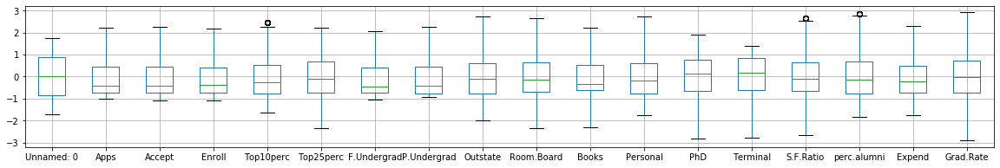

Covariance Matrix 
%s [[ 1.00128866e+00  1.96279844e-01  2.08541252e-01  2.25876917e-01
   1.32853436e-02  3.71210754e-02  2.32525819e-01  1.89487404e-01
  -9.13527318e-02 -8.53045220e-03  6.60645483e-02  1.59349841e-01
   1.17143216e-01  1.22403351e-01  7.60017956e-02 -1.11255990e-01
   6.32556424e-03 -2.90852039e-02]
 [ 1.96279844e-01  1.00128866e+00  9.56537704e-01  8.98039052e-01
   3.21756324e-01  3.64960691e-01  8.62111140e-01  5.20492952e-01
   6.54209711e-02  1.87717056e-01  2.36441941e-01  2.30243993e-01
   4.64521757e-01  4.35037784e-01  1.26573895e-01 -1.01288006e-01
   2.43248206e-01  1.50997775e-01]
 [ 2.08541252e-01  9.56537704e-01  1.00128866e+00  9.36482483e-01
   2.23586208e-01  2.74033187e-01  8.98189799e-01  5.73428908e-01
  -5.00874847e-03  1.19740419e-01  2.08974091e-01  2.56676290e-01
   4.27891234e-01  4.03929238e-01  1.88748711e-01 -1.65728801e-01
   1.62016688e-01  7.90839722e-02]
 [ 2.25876917e-01  8.98039052e-01  9.36482483e-01  1.00128866e+00
   1.71977357e-

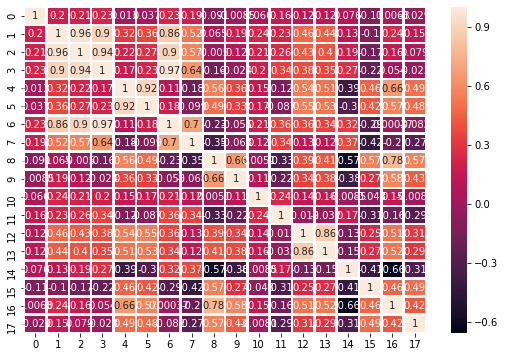

Eigen Vectors 
%s [[-4.92385131e-02 -1.25297305e-01 -1.72451316e-01  2.14674806e-02
  -8.56794175e-01 -4.19040628e-01  1.69509494e-01  7.61125641e-02
   5.47237497e-02 -3.38548332e-02  4.46433024e-02  1.87683296e-02
   2.38376850e-04 -3.63560357e-03 -2.52963375e-02  1.72228791e-02
  -4.69249983e-03  9.20105672e-05]
 [-2.71624735e-01 -3.00866140e-01  9.66040784e-02  9.63929167e-02
   1.42908036e-01 -1.71742289e-01  4.79880802e-03  2.28416852e-02
   8.92479154e-02  1.33920197e-01  1.53088544e-01 -8.69712710e-02
   1.82199265e-01 -5.99133221e-01 -8.64626865e-02  9.04355552e-02
   5.57940755e-03 -5.49427081e-01]
 [-2.41081478e-01 -3.32385622e-01  1.21832777e-01  1.16152257e-01
   1.23197463e-01 -1.48509551e-01 -1.50375072e-02  5.46927589e-03
   1.36266128e-01  1.45309254e-01  1.45794396e-01 -4.32257118e-02
  -3.91073638e-01  6.61444066e-01 -1.57525640e-01  4.79661709e-02
   1.40473913e-02 -2.91563455e-01]
 [-2.01159421e-01 -3.72011276e-01  9.87774305e-02  7.54823612e-03
   1.04348063e-01 -

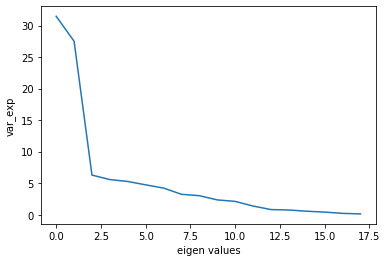

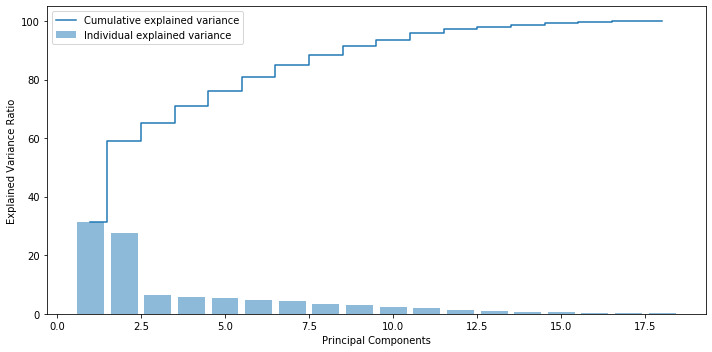

PCA Components when no of components =11
[[ 4.92385131e-02  2.71624735e-01  2.41081478e-01  2.01159421e-01
   3.35013124e-01  3.32153785e-01  1.75770975e-01  3.39671788e-02
   2.74741967e-01  2.39582191e-01  9.95605627e-02 -2.71987257e-02
   3.27818155e-01  3.24249201e-01 -1.54730361e-01  1.77819445e-01
   3.23410775e-01  2.33041067e-01]
 [ 1.25297305e-01  3.00866140e-01  3.32385622e-01  3.72011276e-01
  -1.11618673e-01 -7.18806567e-02  3.88810903e-01  3.53706307e-01
  -2.61135772e-01 -1.39904102e-01  8.94861871e-02  2.33265687e-01
   4.28219818e-02  3.12661170e-02  2.63145765e-01 -2.62592389e-01
  -1.70666137e-01 -1.75144360e-01]
 [ 1.72451316e-01 -9.66040784e-02 -1.21832777e-01 -9.87774305e-02
   7.16814782e-02  4.39536972e-02 -8.55210924e-02 -4.48364493e-02
  -1.54511088e-02  2.40863035e-02  6.71627870e-01  5.28622040e-01
  -6.87235250e-02 -4.42517790e-02 -2.77757889e-01 -1.04241365e-01
   1.85891750e-01 -2.43591722e-01]
 [ 2.14674806e-02  9.63929167e-02  1.16152257e-01  7.54823612e

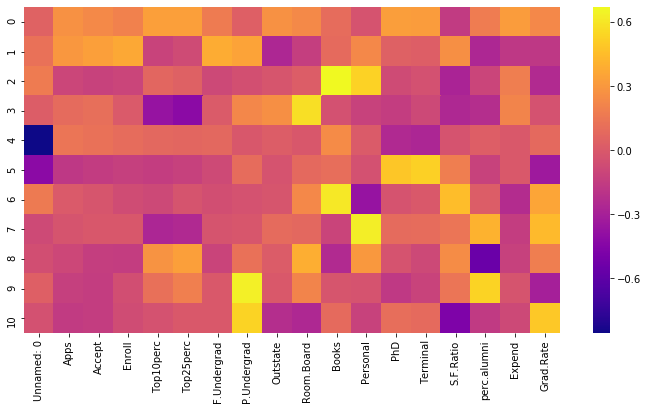

Unnamed: 0     0
perc.alumni    0
S.F.Ratio      0
Terminal       0
PhD            0
Personal       0
Books          0
Room.Board     0
Outstate       0
P.Undergrad    0
F.Undergrad    0
Top25perc      0
Top10perc      0
Enroll         0
Accept         0
Apps           0
Expend         0
Grad.Rate      0
dtype: int64
Total outlier sum
 0


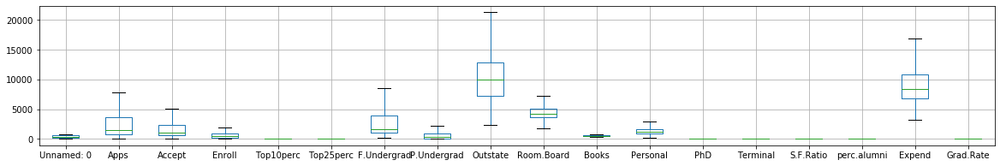

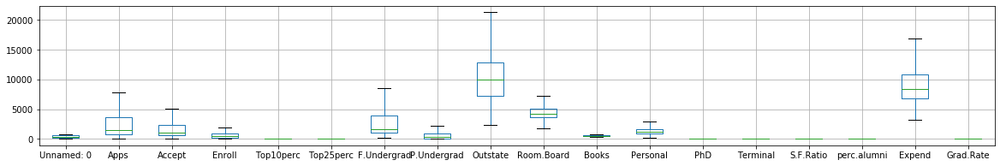

Correlation Matrix 
%s              Unnamed: 0      Apps    Accept    Enroll  Top10perc  Top25perc  \
Unnamed: 0     1.000000  0.196027  0.208273  0.225586   0.013268   0.037073   
Apps           0.196027  1.000000  0.955307  0.896883   0.321342   0.364491   
Accept         0.208273  0.955307  1.000000  0.935277   0.223298   0.273681   
Enroll         0.225586  0.896883  0.935277  1.000000   0.171756   0.230434   
Top10perc      0.013268  0.321342  0.223298  0.171756   1.000000   0.913875   
Top25perc      0.037073  0.364491  0.273681  0.230434   0.913875   1.000000   
F.Undergrad    0.232227  0.861002  0.897034  0.967302   0.111215   0.181196   
P.Undergrad    0.189244  0.519823  0.572691  0.641595  -0.180009  -0.099295   
Outstate      -0.091235  0.065337 -0.005002 -0.155655   0.562160   0.489569   
Room.Board    -0.008519  0.187475  0.119586 -0.023846   0.357366   0.330987   
Books          0.065980  0.236138  0.208705  0.202057   0.153452   0.169761   
Personal       0.159145  0.22

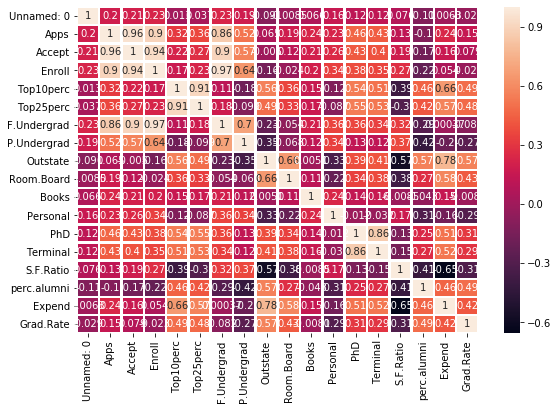

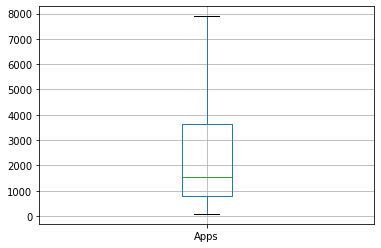

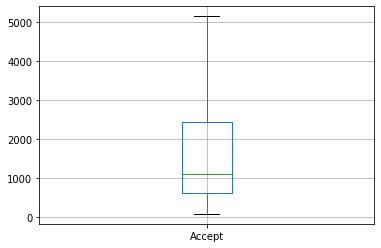

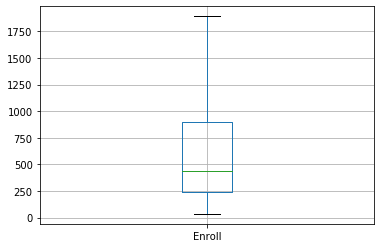

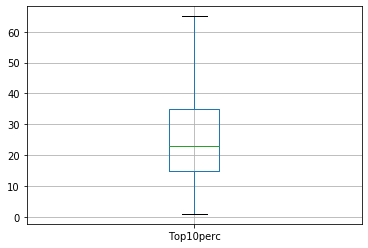

...

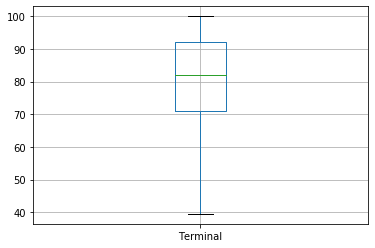

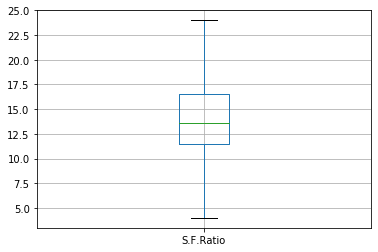

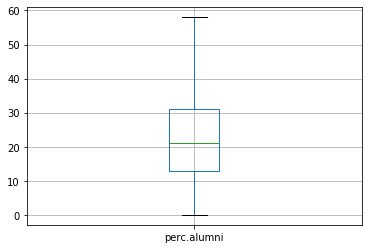

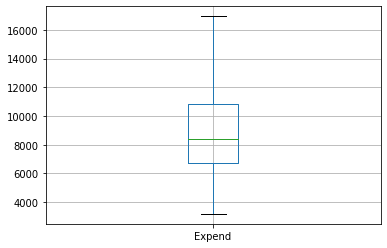

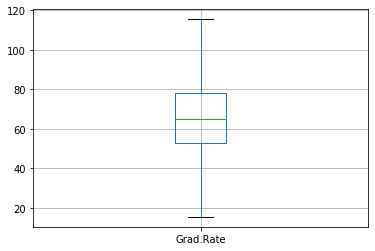

Unnamed: 0     0
perc.alumni    0
S.F.Ratio      0
Terminal       0
PhD            0
Personal       0
Books          0
Room.Board     0
Outstate       0
P.Undergrad    0
F.Undergrad    0
Top25perc      0
Top10perc      0
Enroll         0
Accept         0
Apps           0
Expend         0
Grad.Rate      0
dtype: int64
Total outlier sum
 0


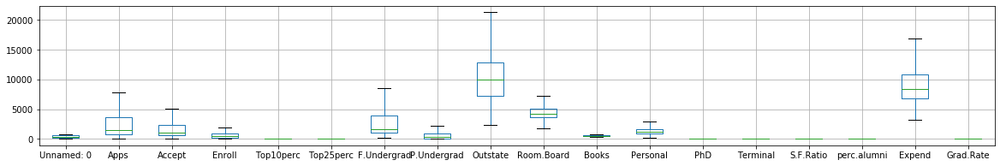

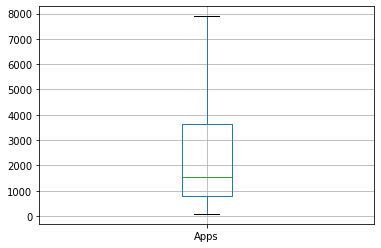

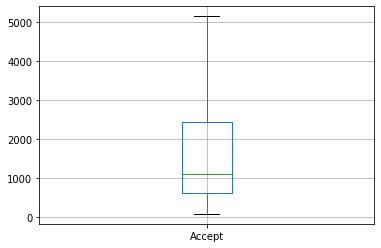

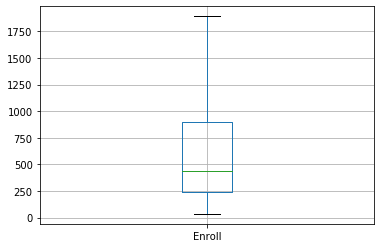

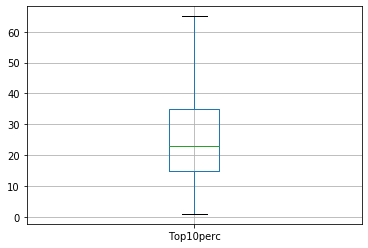

...

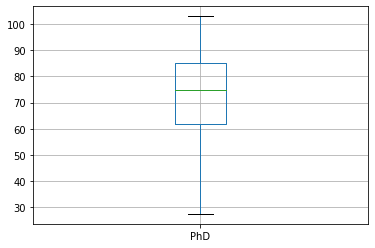

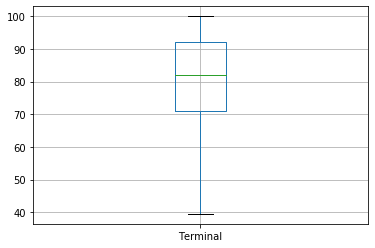

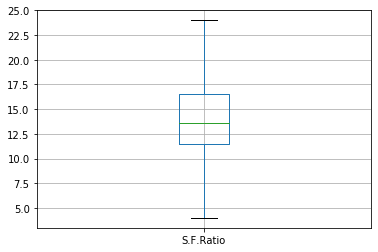

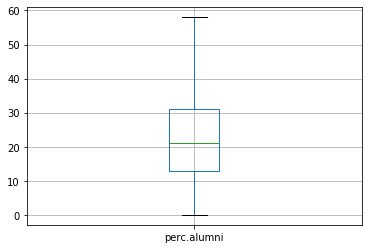

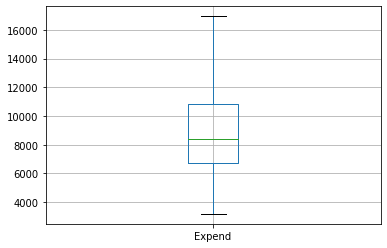

Unnamed: 0      0
Terminal        0
PhD             0
Personal        0
Books           0
Room.Board      0
Expend          0
Outstate        0
F.Undergrad     0
Top25perc       0
Enroll          0
Accept          0
Apps            0
P.Undergrad     0
Grad.Rate       0
perc.alumni     6
S.F.Ratio       8
Top10perc      40
dtype: int64
Total outlier sum
 54


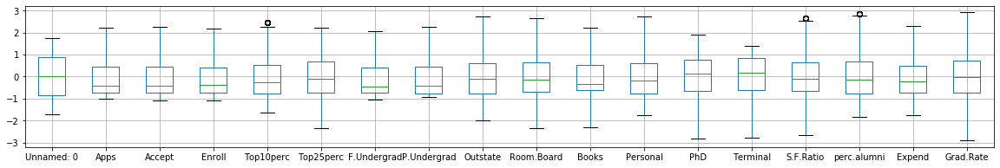

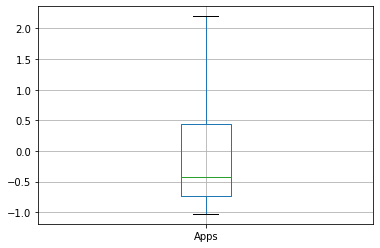

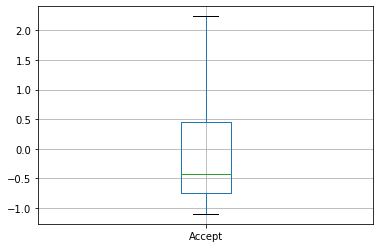

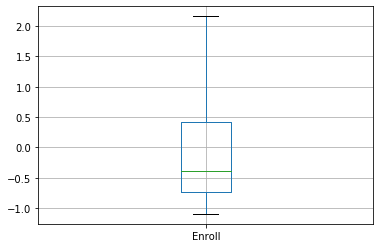

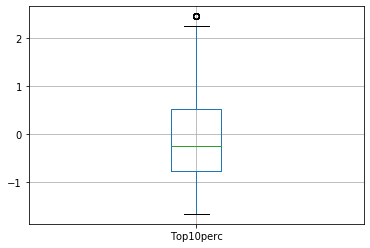

...

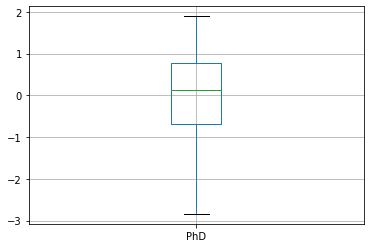

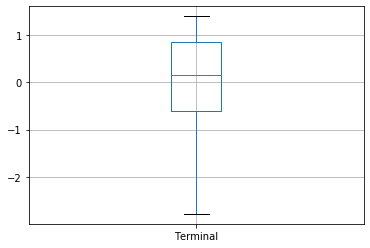

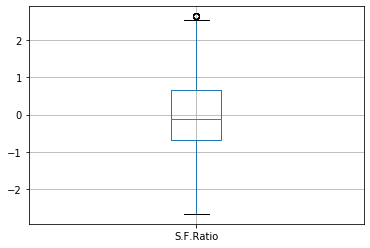

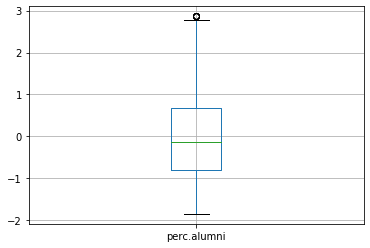

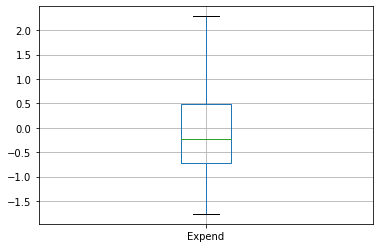

In [2]:
#Importing the libraries
#PCA-After Replacing Outliers
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
import copy
import seaborn as sns
from matplotlib import pyplot as plt
from scipy.integrate import quad
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
from scipy.stats import zscore
from sklearn.decomposition import PCA

class FileRead:
    def readingfile(self,filepath):
        global data
        global data_new
        data = pd.read_csv(filepath)
        data_new = pd.read_csv(filepath)
        pd.set_option('display.max_rows', 500)
        pd.set_option('display.max_columns', 500)
        print("Top 5 rows",data.head())
        
class StatMet(FileRead):
    def StatMetric(self,data,colname):
        print("shaple\n",data.shape)
        print("dtype\n",data.dtypes)
        print("describe\n",data.describe().T)
        print("colnunique\n",data[colname].unique())
        print("isnasum\n",data.isna().sum())
        print("Quesmark\n",data[data[colname]=="?"])
        print("quesmarkcount\n",data[data[colname]=="?"].count())
        print("quesmarkvaluecounts\n",data[colname].value_counts())
    def duphandle(self,data,colname,vartype):
        data[colname].replace("?",'1', inplace=True)
        print(data[colname].value_counts())
        data[colname] = data[colname].astype(vartype)
        dups = data.duplicated()
        print('Number of duplicate rows = %d' % (dups.sum()))
        print(data[dups])
        print('Number of rows before discarding duplicates = %d' % (data.shape[0]))
        data.drop_duplicates(subset = None, keep = 'first', inplace=True)
        print('Number of rows after discarding duplicates = %d' % (data.shape[0]))
        print(data.corr(method='pearson'))  
        
    def plot(self,data):
#         sns.pairplot(data,diag_kind='kde')
#         plt.show()
        data.boxplot(figsize=(20,3))
        plt.show()
        f, ax = plt.subplots(figsize=(9, 6))
        corre=data.corr()
        print('Correlation Matrix \n%s', data.corr())
        print("Correlation HeatMap\n")
        sns.heatmap(corre, annot=True, linewidths=1.5, ax=ax)
        plt.show()
    
    def crosstabdrp(self,data,colname1,colname2,limit):
        print(pd.crosstab(data[colname1], data[colname2]))
        data[colname1] = np.where(data[colname1] >limit, limit, data[colname1])
        print(data[colname1].value_counts())
    
#     def datadrop(self,data,colname1):
#         global data_new
#         data_new = data.drop([colname1], axis =1)
#         print(data_new.head())
    
    def outliercount(self,indata):
        Q1 = indata.quantile(0.25)
        Q3 = indata.quantile(0.75)
        IQR = Q3 - Q1
        OutlierCount=((indata < (Q1 - 1.5 * IQR)) | (indata > (Q3 + 1.5 * IQR))).sum()
        print(OutlierCount.sort_values())
        print("Total outlier sum\n",OutlierCount.sum())
    
class Normalpca(StatMet):
    def Zscoreplot(self,data_new):
#         global data_new
#         data_new=data
        global data_new1
        data_new1=data_new.apply(zscore)
        print('zscore\n',data_new1.head())
        data_new1.boxplot(figsize=(20,3))
        plt.show()
    
    def covmateigen(self,data_new1):
        global cov_matrix
        global eig_vals
        global eig_vecs
        cov_matrix = np.cov(data_new1.T)
        f, ax = plt.subplots(figsize=(9, 6))
        print('Covariance Matrix \n%s', cov_matrix)
        print("Covariance HeatMap\n")
        sns.heatmap(cov_matrix, annot=True, linewidths=1.5, ax=ax)
        plt.show()
        eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
        print('Eigen Vectors \n%s', eig_vecs)
        print('\nFirst Eigen vector\n%s',eig_vecs[0])
        print('\n Eigen Values \n%s', eig_vals)
        print('\nFirst Eigen Value\n%s',eig_vals[0])
    
    def totsumplot(self,eig_vals):
        global tot
        global var_exp
        global cum_var_exp
        tot = sum(eig_vals)
        var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
        print("var_exp\n",var_exp)
        cum_var_exp = np.cumsum(var_exp)
        print("Cumulative Variance Explained", cum_var_exp)
        plt.plot(var_exp)
        plt.ylabel('var_exp')
        plt.xlabel('eigen values')
        plt.show()
    def eigvalplot(self,eig_vals,var_exp,cum_var_exp):
    # Ploting 
        plt.figure(figsize=(10 , 5))
        plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
        plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
        plt.ylabel('Explained Variance Ratio')
        plt.xlabel('Principal Components')
        plt.legend(loc = 'best')
        plt.tight_layout()
        plt.show()
    def boxplot(self,data):
        data.boxplot(figsize=(20,3))
        plt.show()
    def boxplotcolwise(self,data,data_name):
        global colnames
        colnames=list(data.columns.values)
        if(data_name=="data"):
            for i in range(1,18):
                data.boxplot(column=[colnames[i]])
                plt.show()
        else:
            for i in range(1,17):
                data.boxplot(column=[colnames[i]])
                plt.show()

class scikitPCA(Normalpca):
    def sciPCA(self,data_new1,nocomp):
        global pca
        pca = PCA(n_components=nocomp)
        data_reduced = pca.fit_transform(data_new1)
#         print(data_reduced.transpose())
        print("PCA Components when no of components ="+str(nocomp)+"\n"+str(pca.components_))
        df_comp = pd.DataFrame(pca.components_,columns=list(data_new1))
        print("PCA DataFrame when no of components ="+str(nocomp)+"\n"+str(df_comp.head()))
    def dfcompheatmap(self,pca,data_new1):
        global df_comp
        df_comp = pd.DataFrame(pca.components_,columns=list(data_new1))
#         print(df_comp.head())
        plt.figure(figsize=(12,6))
        sns.heatmap(df_comp,cmap='plasma',)
        plt.show()

S=scikitPCA()
S.readingfile('D:/GL/Total DS Codes2/Assignment3/Education_Post_12th_Standard_nooutliers.csv')
# S.datadrop(data,'Names')
# S.StatMetric(data,'num_comments')
S.Zscoreplot(data_new)
S.covmateigen(data_new1)
S.totsumplot(eig_vals)
S.eigvalplot(eig_vals,var_exp,cum_var_exp)
S.sciPCA(data_new1,11)
S.dfcompheatmap(pca,data_new1)
S.outliercount(data)
S.boxplot(data)
S.plot(data)
S.boxplotcolwise(data,"data")
S.outliercount(data_new)
S.boxplot(data_new)
S.boxplotcolwise(data_new,"data_new")
S.outliercount(data_new1)
S.boxplot(data_new1)
S.boxplotcolwise(data_new1,"data_new1")